# Care Bank: Term Deposit Subscription Prediction
_Ensemble Techniques - Boosting_

__Joseph Reves joe.reves@gmail.com__

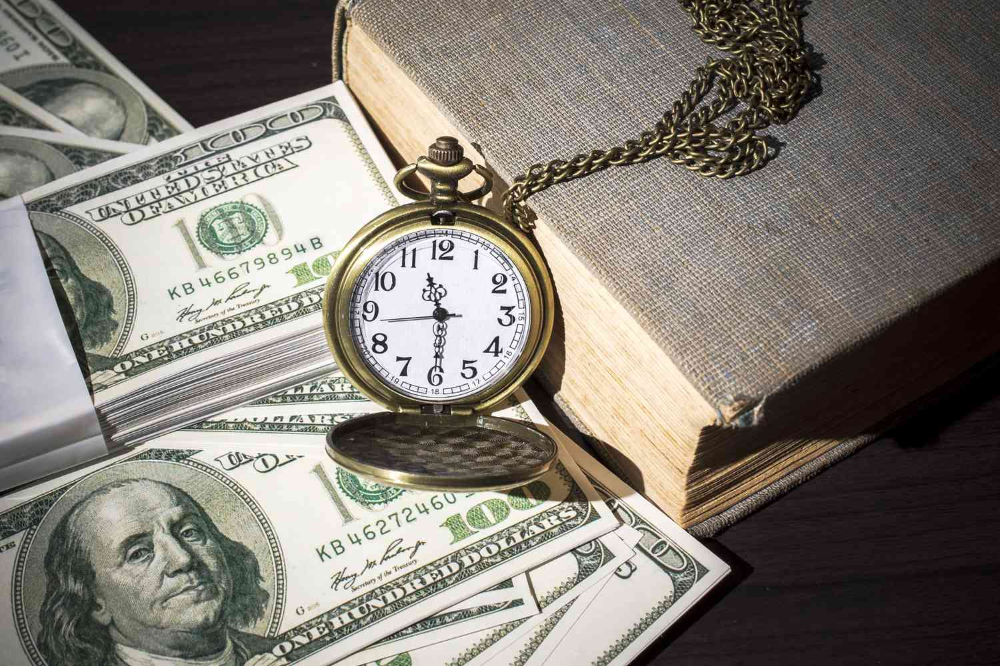

## Context and Objectives:

Care Bank ran a campaign for term-deposit subscription last year for its existing customers that showed a healthy conversion rate of over 12%. The bank is interested in a term deposit subscription because it gets good returns from a term deposit than a savings account as the customer is deprived of the rights to access the money prior to the maturity unless the customer is ready to compensate the bank. Banks can use that money to invest in other markets for better returns.

Now, the bank is planning to launch a new campaign again but this time it wants to utilize data available from previous campaigns and also to automate this process with better target marketing to increase the success ratio with a minimal budget.

#### What is a Term Deposit?
A term deposit is a deposit that a bank or a financial institution offers with a fixed rate (often better than just opening a deposit account) in which your money will be returned back at a specific maturity time.

__Objective__
You, as a Data scientist at Care bank, have to build a model that will help the marketing department, in next campaign, to identify the customers who have a higher probability of subscribing to the term deposit. This will increase the success ratio while at the same time reduce the cost of the campaign.

__Data Dictionary__

__Bank client data:__
1. age: Age of customer
2. job: Type of job
3. marital: Marital status of customer
4. education: Eduction of customer
5. default: has credit in default?
6. housing: has housing loan?
7. loan: has a personal loan?
8. balance: balance in the account
9. contact: contact communication type

__Related to this campaign:__
1. month: last contact month of the year
2. day: last contact day of the week
3. campaign: number of contacts performed during this campaign and for this client

__Related to the previous campaign:__
1. pdays: number of days that passed by after the client was last contacted from a previous campaign
2. previous: number of contacts performed before this campaign and for this client
3. poutcome: outcome of the previous marketing campaign
4. Target: has the client subscribed to a term deposit?

__Customer interaction data:__
1. duration: last contact duration, in seconds

### Assignment Objectives

__Exploratory Data Analysis__
* Univariate analysis - Key meaningful observations on individual variables and the relationship between variables
* Bivariate analysis - Use appropriate visualizations to identify the patterns and insights

__Data Pre-processing__
* Missing value Treatment
* Outlier Detection(treat, if needed- why or why not )
* Feature Engineering
* Prepare data for modeling

__Model Building: Bagging__
* Build Bagging classifier, Random Forest, and Decision Tree
* Comment on model performance

__Model Performance Improvement: Bagging__
* Identify the appropriate metric for model performance evaluation and why
* Comment on the model performance after tuning the Decision Tree, Bagging, and Random Forest classifiers

__Model Building: Boosting__
* Build Adaboost, GradientBoost, XGBoost, and Stacking classifiers
* Comment on model performance

__Model Performance Improvement: Boosting__
* Identify the appropriate metric for model performance evaluation and why
* Comment on the model performance after tuning the AdaBoost, and Gradient Boosting classifiers 
  * _Please note XGBoost can take a significantly longer time to run, so if you have time complexity issues then you can avoid tuning XGBoost_

__Actionable Insights & Recommendations__
* Compare model performance on various metrics
* Conclude with the key takeaways - What would your advice be to grow the business?

__Notebook - Overall__
* Structure and flow
* Well commented code

## Importing Necessary Libraries

In [1]:
# this will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

# Supress and filter unecessary warning messages
import warnings

warnings.filterwarnings("ignore")

# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# useful utilities
import pandas_profiling

# libaries to help with data visualization
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

# To build models for prediction

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
    precision_recall_curve,
    roc_curve,
    classification_report,
)
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier,StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

# To install xgboost library use - !pip install xgboost
from xgboost import XGBClassifier


<IPython.core.display.Javascript object>

## Explore the characteristics of the data

<div class="alert alert-block alert-info">
<b>Dependency:</b> Loading the "bank-full.csv" file from the local directory where the notebook is stored. For this project, I'm using Anaconda on my local machine.
</div>

In [2]:
# Reading the Tourism dataset with the read_csv function from pandas package
banking = pd.read_csv("bank-full.csv")

<IPython.core.display.Javascript object>

In [3]:
# Let's make a copy while we explore the data, and potentially make some changes
clients = banking.copy()

<IPython.core.display.Javascript object>

In [4]:
# Quick look at a random sample of values in the data
clients.sample(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
42788,63,technician,married,secondary,no,896,yes,no,cellular,28,jan,115,3,91,4,other,no
21584,38,management,single,tertiary,no,231,no,no,cellular,19,aug,118,2,-1,0,unknown,no
25656,57,unemployed,divorced,secondary,no,2762,no,no,telephone,19,nov,100,1,-1,0,unknown,no
23546,34,technician,married,secondary,no,1,no,no,cellular,28,aug,535,2,-1,0,unknown,yes
23401,40,technician,married,secondary,no,4594,no,no,telephone,27,aug,296,5,-1,0,unknown,no
8911,40,services,married,secondary,no,113,yes,no,unknown,4,jun,126,1,-1,0,unknown,no
11356,36,blue-collar,married,secondary,no,537,no,no,unknown,19,jun,160,6,-1,0,unknown,no
74,43,technician,married,secondary,no,1937,yes,no,unknown,5,may,181,1,-1,0,unknown,no
39138,50,technician,divorced,secondary,no,116,yes,no,cellular,18,may,40,2,321,14,other,no
42206,52,technician,married,tertiary,no,1785,no,no,cellular,10,nov,133,3,89,1,failure,no


<IPython.core.display.Javascript object>

In [5]:
# What's the size and shape of the data?
print(
    "The available data includes",
    clients.shape[0],
    "rows, with",
    clients.shape[1],
    "columns of information",
)

The available data includes 45211 rows, with 17 columns of information


<IPython.core.display.Javascript object>

In [6]:
# How is the data currently typed by python?
clients.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


<IPython.core.display.Javascript object>

In [7]:
# check for null values in the data
clients.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
Target       0
dtype: int64

<IPython.core.display.Javascript object>

In [8]:
# describe the object variables
clients.describe(include="object").T

,count,unique,top,freq
job,45211,12,blue-collar,9732
marital,45211,3,married,27214
education,45211,4,secondary,23202
default,45211,2,no,44396
housing,45211,2,yes,25130
loan,45211,2,no,37967
contact,45211,3,cellular,29285
month,45211,12,may,13766
poutcome,45211,4,unknown,36959
Target,45211,2,no,39922


<IPython.core.display.Javascript object>

In [9]:
# describe the numeric variables
clients.describe(exclude="object").T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


<IPython.core.display.Javascript object>

In [10]:
object_cols = clients.select_dtypes(["object"])
object_cols.columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'poutcome', 'Target'],
      dtype='object')

<IPython.core.display.Javascript object>

In [11]:
columns = clients.columns
print(columns)

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'Target'],
      dtype='object')


<IPython.core.display.Javascript object>

In [12]:
# check our independent variables for duplicates
clients[
    clients.duplicated(
        subset=[
            "age",
            "job",
            "marital",
            "education",
            "default",
            "balance",
            "housing",
            "loan",
            "contact",
            "day",
            "month",
            "duration",
            "campaign",
            "pdays",
            "previous",
            "poutcome",
        ],
        keep=False,
    )
].sort_values(by=["job"])

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


<IPython.core.display.Javascript object>

No duplicate records with this subset of variables!

## Prepare the data for analysis

In [13]:
# Let's look at the unique values for our objects
for i in object_cols.columns:
    print("Unique values in", i, "are :")
    print(object_cols[i].value_counts())
    print("*" * 50)

Unique values in job are :
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64
**************************************************
Unique values in marital are :
married     27214
single      12790
divorced     5207
Name: marital, dtype: int64
**************************************************
Unique values in education are :
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64
**************************************************
Unique values in default are :
no     44396
yes      815
Name: default, dtype: int64
**************************************************
Unique values in housing are :
yes    25130
no     20081
Name: housing, dtype: int64
**************************************************
Unique v

<IPython.core.display.Javascript object>

* There may be a number of customers with negative balances; I think we'll find they are not good candidates. 
* The '-1' `pdays` values are probably "never contacted." 
* The trailing period in "admin." in jobs is unecessary - let's remove it
* `contact` variable looks completely useless. 
* The "other" outcome from the previous campaign is probably not going to be useful.
* The "unknown" job types aren't going to help us
* The "unknown" education isn't going to help us

Let's trim off the records with missing useful values at this point.

In [14]:
# fix the trailing period in job
clients.loc[clients["job"] == "admin.", "job"] = "admin"
print(clients["job"].value_counts())

blue-collar      9732
management       9458
technician       7597
admin            5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64


<IPython.core.display.Javascript object>

In [15]:
# This doesn't appear to be useful at all. It's not really a characteristic of a potential customer
clients.drop("contact", axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [16]:
# drop records with an unknown outcome from the previous campaign - there's no predictive value
clients.drop(clients[clients["poutcome"] == "other"].index, inplace=True)

<IPython.core.display.Javascript object>

In [17]:
# likewise, unknown job types won't help us make predictions
clients.drop(clients[clients["job"] == "unknown"].index, inplace=True)

<IPython.core.display.Javascript object>

In [18]:
# Let's drop unknown education, as well - it's not differentiating
clients.drop(clients[clients["education"] == "unknown"].index, inplace=True)

<IPython.core.display.Javascript object>

In [19]:
columns = clients.columns
print(columns)

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'day', 'month', 'duration', 'campaign', 'pdays', 'previous',
       'poutcome', 'Target'],
      dtype='object')


<IPython.core.display.Javascript object>

In [20]:
object_cols = clients.select_dtypes(["object"])
object_cols.columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'month',
       'poutcome', 'Target'],
      dtype='object')

<IPython.core.display.Javascript object>

In [21]:
# Convert our object types to categories
for i in object_cols.columns:
    clients[i] = clients[i].astype("category")

<IPython.core.display.Javascript object>

In [22]:
clients.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41419 entries, 0 to 45209
Data columns (total 16 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   age        41419 non-null  int64   
 1   job        41419 non-null  category
 2   marital    41419 non-null  category
 3   education  41419 non-null  category
 4   default    41419 non-null  category
 5   balance    41419 non-null  int64   
 6   housing    41419 non-null  category
 7   loan       41419 non-null  category
 8   day        41419 non-null  int64   
 9   month      41419 non-null  category
 10  duration   41419 non-null  int64   
 11  campaign   41419 non-null  int64   
 12  pdays      41419 non-null  int64   
 13  previous   41419 non-null  int64   
 14  poutcome   41419 non-null  category
 15  Target     41419 non-null  category
dtypes: category(9), int64(7)
memory usage: 2.9 MB


<IPython.core.display.Javascript object>

* Memory usage is down substantially with the removal of dups, an extraneous columen, and the coversion of objects to categories

* __The initial data preparation is complete. I'll do the Univariate and Multivariate analysis with the categories, and restructure the variables in the subsequent step__

* __Observations__
    * No duplicates detected
    * Object variables converted to categorical, with the categories enumerated
    * Corrected a typo in the job field (admin. to admin)
    * Deleted rows from `poutcome`,`job`, and `education` with no use predictive values
    * Dropped the contact type column, as there's no predictive value there
    * We have a complete dataset of 41419 non-duplicated rows

## Exploratory Data Analysis

#### Useful Functions

In [23]:
# Defining the function for creating boxplot and histogram
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None, hue=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots

    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="mediumturquoise"
    )  # boxplot will be created and a star will indicate the mean value of the column

    if (bins) and (hue):
        sns.histplot(
            data=data,
            x=feature,
            kde=kde,
            ax=ax_hist2,
            hue=hue,
            bins=bins,
            color="mediumpurple",
        )
    elif bins:
        sns.histplot(
            data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, color="mediumpurple"
        )
    elif hue:
        sns.histplot(
            data=data, x=feature, kde=kde, hue=hue, ax=ax_hist2, color="mediumpurple"
        )
    else:
        sns.histplot(
            data=data, x=feature, kde=kde, ax=ax_hist2, color="mediumpurple"
        )  # For histogram

    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram

    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

In [24]:
# Let's use pandas profiling from y-data to explore the larger dataset
clients.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

##### In addition to the details we'll find on individual variables in the profiling reports, let's also take a look at some of the interactions between variables here:

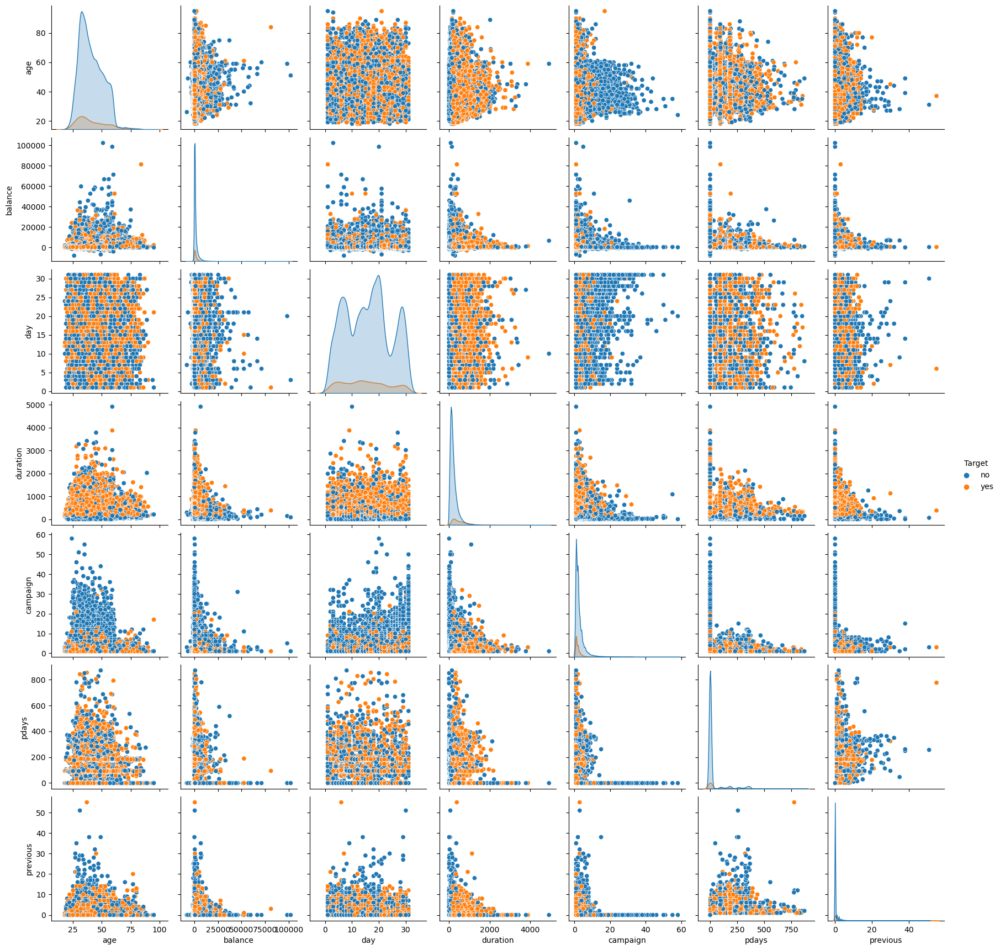

<IPython.core.display.Javascript object>

In [25]:
sns.pairplot(clients, diag_kind="kde", hue="Target")
plt.show()

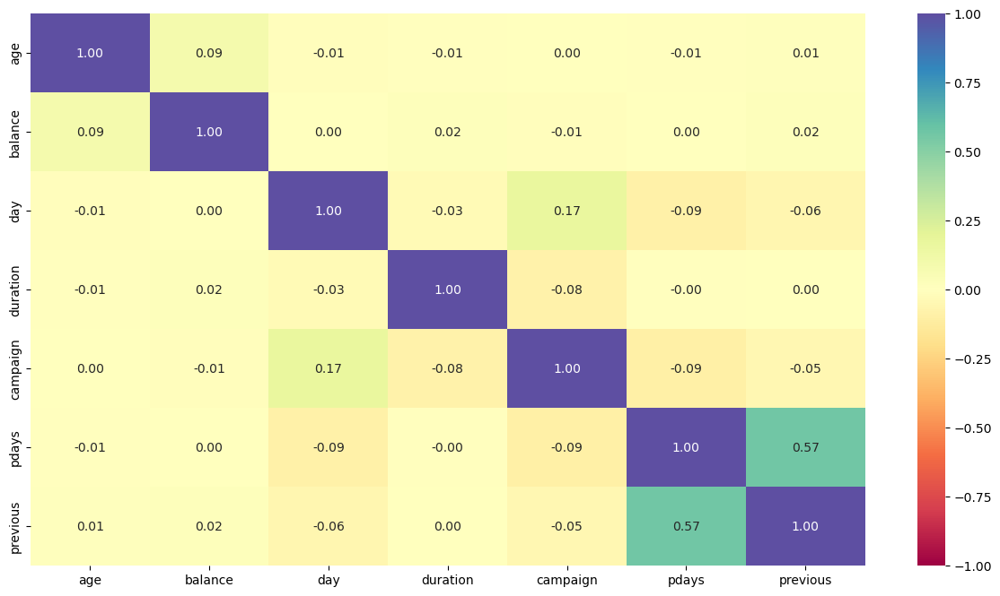

<IPython.core.display.Javascript object>

In [26]:
plt.figure(figsize=(15, 8))
sns.heatmap(clients.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

#### Observations

__Variables__
* age - slightly right-skewed, with a mean about 41 years old. 
* job - equal numbers of blue-collar and management workers, with a mix of other occupations
* marital status - 60% of our clients are married, about 28% single and the remaining divorced
* loan defaults - historically, we've had only 1.8% of our borrowers default on a loan
* account balance - we have a significant number of clients with zero balances, and a significant number of outliers with negative balances.  Balances are skewed, with a mean of \\$1348.00, but a mode of \\$437.00.
* housing - 56% of our clients have taken mortgage loans
* personal loans - 16.5% of our clients have taken personal loans
* day - shows a distribution for last contact day of the month. you can see contacts are distributed mostly on weekdays, and more frequently around the 20th.
* month - shows we're contacting customers more often in may, july, and august - perhaps coinciding with our loan campaign kickoffs 
* duration - our most recent contacts with customers average about 258 seconds each, or a little over 4 minutes. There's a significant standard deviation of about the same - a little over 4 minutes
* campaign contacts - average number of contacts is about 3, with a mode of two contacts
* previous contacts / pdays - 85% of our clients have not been contacted at all in a previous campaign
* outcomes  - 3.4% of our clients took a CD in the last campaign; 85% are "unknown", because they've never been contacted.  We have an actual failure rate of 11.4% from customers that rejected the offer in the last campaign.

__Correlations__
* We see mostly weak correlations between our variables, with no real differentiating relationships at this point.
* Let's explore a few of our categories

In [27]:
categories = clients.select_dtypes(["category"])
categorical_cols = categories.columns

<IPython.core.display.Javascript object>

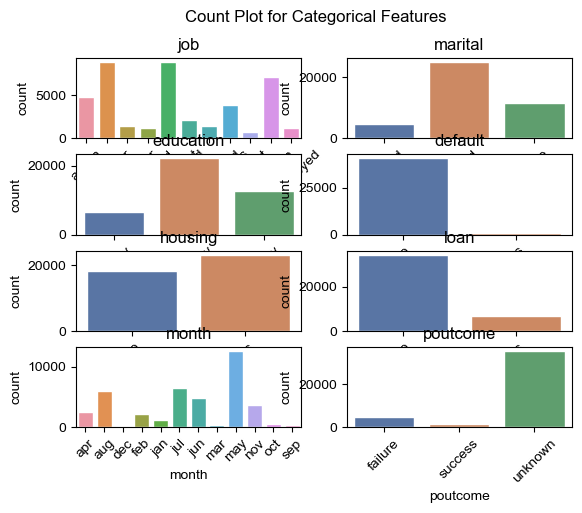

<IPython.core.display.Javascript object>

In [28]:
fig, axes = plt.subplots(4, 2)
fig.suptitle("Count Plot for Categorical Features")
sns.set(rc={"figure.figsize": (10, 12)})

sns.countplot(ax=axes[0, 0], x=categorical_cols[0], data=clients)
axes[0, 0].set_title(categorical_cols[0])

sns.countplot(ax=axes[0, 1], x=categorical_cols[1], data=clients)
axes[0, 1].set_title(categorical_cols[1])

sns.countplot(ax=axes[1, 0], x=categorical_cols[2], data=clients)
axes[1, 0].set_title(categorical_cols[2])

sns.countplot(ax=axes[1, 1], x=categorical_cols[3], data=clients)
axes[1, 1].set_title(categorical_cols[3])

sns.countplot(ax=axes[2, 0], x=categorical_cols[4], data=clients)
axes[2, 0].set_title(categorical_cols[4])

sns.countplot(ax=axes[2, 1], x=categorical_cols[5], data=clients)
axes[2, 1].set_title(categorical_cols[5])

sns.countplot(ax=axes[3, 0], x=categorical_cols[6], data=clients)
axes[3, 0].set_title(categorical_cols[6])

sns.countplot(ax=axes[3, 1], x=categorical_cols[7], data=clients)
axes[3, 1].set_title(categorical_cols[7])

for ax in axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.tight_layout()
plt.show()

Text(0, 0.5, 'Target %')

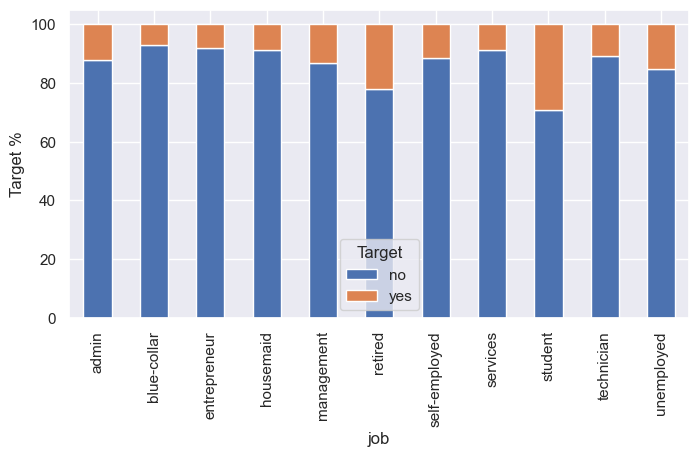

<IPython.core.display.Javascript object>

In [29]:
(pd.crosstab(clients["job"], clients["Target"], normalize="index") * 100).plot(
    kind="bar", figsize=(8, 4), stacked=True
)
plt.ylabel("Target %")

Text(0, 0.5, 'Target %')

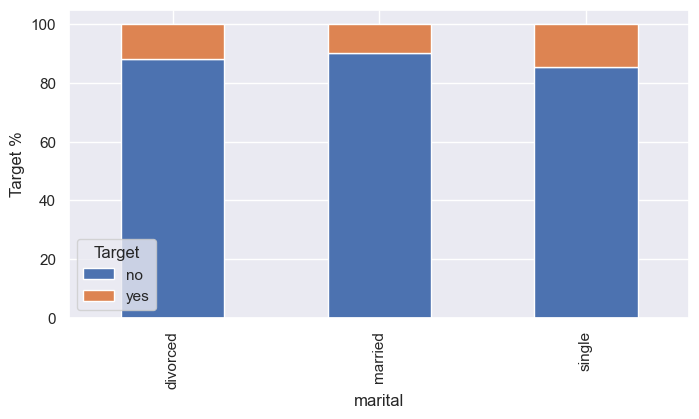

<IPython.core.display.Javascript object>

In [30]:
(pd.crosstab(clients["marital"], clients["Target"], normalize="index") * 100).plot(
    kind="bar", figsize=(8, 4), stacked=True
)
plt.ylabel("Target %")

Text(0, 0.5, 'Target %')

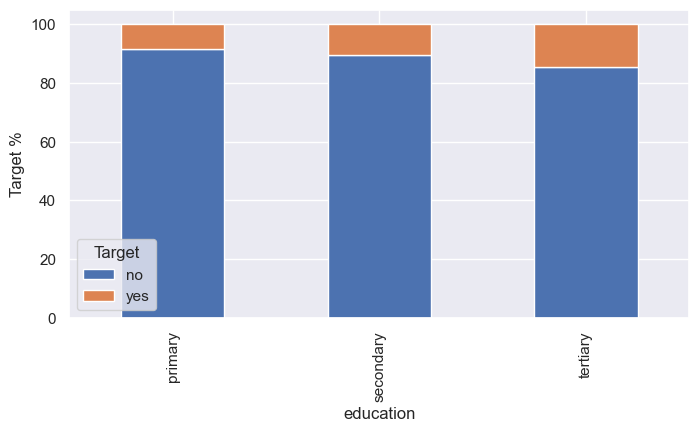

<IPython.core.display.Javascript object>

In [31]:
(pd.crosstab(clients["education"], clients["Target"], normalize="index") * 100).plot(
    kind="bar", figsize=(8, 4), stacked=True
)
plt.ylabel("Target %")

Text(0, 0.5, 'Target %')

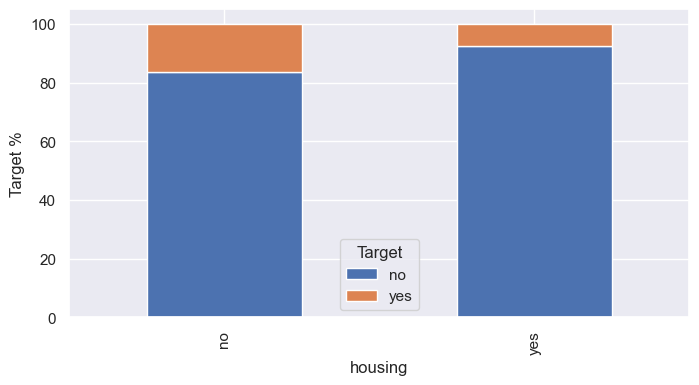

<IPython.core.display.Javascript object>

In [32]:
(pd.crosstab(clients["housing"], clients["Target"], normalize="index") * 100).plot(
    kind="bar", figsize=(8, 4), stacked=True
)
plt.ylabel("Target %")

Text(0, 0.5, 'Target %')

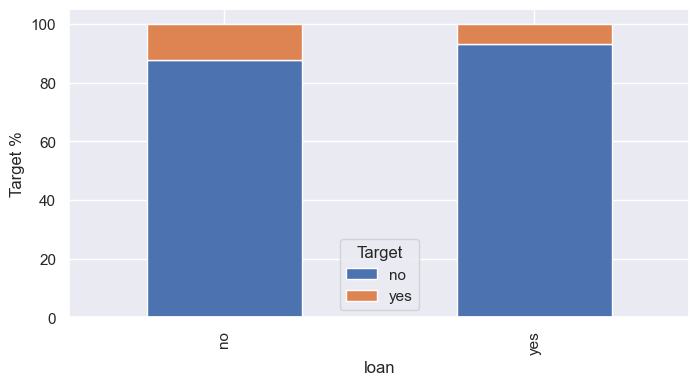

<IPython.core.display.Javascript object>

In [33]:
(pd.crosstab(clients["loan"], clients["Target"], normalize="index") * 100).plot(
    kind="bar", figsize=(8, 4), stacked=True
)
plt.ylabel("Target %")

#### Observations
* Breaking down some of the categories, we find:
    * Retired customers - and students - are the most likely to have taken CD's, but we do see a mix of people with various types of jobs take out CDs. Even those currently unemployed, but that do not identify as retired.
    * Single customers - particularly when we consider those who are divorced as a single - are more prevalent.
    * Higher education levels correlate positively with CD customers.  We can speculate that you need a more educated view of money and income to choose this type of investment. It would be interesting in a separate study to correlate bitcoin customers with education.
    * People without home loans are more likely to take out CDs. That makes sense; if you have a home loan, that is a form of long-term investment.
    * The cyclic "month" value suggests we're making a concerted effort only around our launches, rather than continuously and consistently.  This will be a recommendation to change the sales process.
    * Likewise, there's a huge percentage of our customers we haven't contacted. We need to reach out to these customers, and to carefully track our contacts.

## Model Construction

#### Data Preparation

The bulk of our data preparation is already completed - duplicates, missing values, outliers evaluated. The remaining work is to encode our categories. 

We'll also drop the historical columns from the last campaign, since those won't be good predictors for identifying new customers.

In [34]:
# Here's where we're starting
clients.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41419 entries, 0 to 45209
Data columns (total 16 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   age        41419 non-null  int64   
 1   job        41419 non-null  category
 2   marital    41419 non-null  category
 3   education  41419 non-null  category
 4   default    41419 non-null  category
 5   balance    41419 non-null  int64   
 6   housing    41419 non-null  category
 7   loan       41419 non-null  category
 8   day        41419 non-null  int64   
 9   month      41419 non-null  category
 10  duration   41419 non-null  int64   
 11  campaign   41419 non-null  int64   
 12  pdays      41419 non-null  int64   
 13  previous   41419 non-null  int64   
 14  poutcome   41419 non-null  category
 15  Target     41419 non-null  category
dtypes: category(9), int64(7)
memory usage: 3.9 MB


<IPython.core.display.Javascript object>

In [35]:
# We'll drop month.  It's historical, and doesn't offer any any predictive value
clients.drop("month", axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [36]:
# We'll drop day.  It's historical, and doesn't offer any any predictive value
clients.drop("day", axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [37]:
# We'll remap Target now

clients["Target"].replace("no", 0, inplace=True)
clients["Target"].replace("yes", 1, inplace=True)
clients["Target"] = clients["Target"].astype("int64")

<IPython.core.display.Javascript object>

In [38]:
print(clients["Target"].value_counts())

0    36691
1     4728
Name: Target, dtype: int64


<IPython.core.display.Javascript object>

In [39]:
# OneHotEncoding our categories
oneHotCols = ["job", "marital", "education", "default", "housing", "loan", "poutcome"]
clients = pd.get_dummies(clients, columns=oneHotCols)

<IPython.core.display.Javascript object>

In [40]:
# Here's what we'll work with to build our models
clients.head(25).T

,0,1,2,5,6,7,8,9,10,11,...,19,20,21,22,23,24,25,26,27,28
age,58,44,33,35,28,42,58,43,41,29,...,33,28,56,32,25,40,44,39,52,46
balance,2143,29,2,231,447,2,121,593,270,390,...,0,723,779,23,50,0,-372,255,113,-246
duration,261,151,76,139,217,380,50,55,222,137,...,54,262,164,160,342,181,172,296,127,255
campaign,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,2
pdays,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
previous,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Target,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
job_admin,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,1,0,0,0
job_blue-collar,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
job_entrepreneur,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


<IPython.core.display.Javascript object>

In [41]:
# And finally
clients.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41419 entries, 0 to 45209
Data columns (total 33 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   age                  41419 non-null  int64
 1   balance              41419 non-null  int64
 2   duration             41419 non-null  int64
 3   campaign             41419 non-null  int64
 4   pdays                41419 non-null  int64
 5   previous             41419 non-null  int64
 6   Target               41419 non-null  int64
 7   job_admin            41419 non-null  uint8
 8   job_blue-collar      41419 non-null  uint8
 9   job_entrepreneur     41419 non-null  uint8
 10  job_housemaid        41419 non-null  uint8
 11  job_management       41419 non-null  uint8
 12  job_retired          41419 non-null  uint8
 13  job_self-employed    41419 non-null  uint8
 14  job_services         41419 non-null  uint8
 15  job_student          41419 non-null  uint8
 16  job_technician       4

<IPython.core.display.Javascript object>

## Prediction Models

For this next campaign, we have the results of the last campaign, and the distinguishing characteristics of the customers that purchased CDs last time. The data seems pretty sparse, with little differentiation.

We're looking for some guidance to identify and predict the successful outcome, which would be our client purchasing a Certificate of Deposit. So we're looking for those characteristics with can use for planning, making staffing decisions, arming the sales teams, etc. 

We're trying to use the past behavior of purchasing a CD as an indication that a customer might be likely to purchase a new offering. We're not considering here any market research that would make the features of this package attractive to potential new buyers, just analyzing our existing customer data.

The dependent variable in our data is __Target__.

__What are the consequences of predicting the wrong result?__
  * If we predict that a customer will not purchase a CD, but they actually would purchase then we missed the opportunity to engage with them, and we potentially __lose the business__ by not offering it.
  * If we predict that a customer is a good candidate to purchase our CD, but they turn out not to want one - we __lose some time__ in the sales process, but it's negligible. 
  
__What's the greater negative consequence?__
  * Failing to correctly identify all of the potential customers for our CD - we can lose valuable business
  
__We should optimize our model for recall__
  * This gives us the ratio of Predicted positives to Actual positives, so we'll minimize our false negatives

#### Useful Common Functions to Evaluate Performance

In [42]:
## Function to create confusion matrix
def make_confusion_matrix(model, y_actual, labels=[1, 0]):
    """
    model : classifier to predict values of X
    y_actual : ground truth

    """
    y_predict = model.predict(X_test)
    cm = metrics.confusion_matrix(y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(
        cm,
        index=[i for i in ["Actual - No", "Actual - Yes"]],
        columns=[i for i in ["Predicted - No", "Predicted - Yes"]],
    )
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    plt.figure(figsize=(10, 7))
    sns.heatmap(df_cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

<IPython.core.display.Javascript object>

In [43]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model, flag=True):
    """
    model : classifier to predict values of X

    """
    # defining an empty list to store train and test results
    score_list = []

    # Predicting on train and tests
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)

    # Accuracy of the model
    train_acc = model.score(X_train, y_train)
    test_acc = model.score(X_test, y_test)

    # Recall of the model
    train_recall = metrics.recall_score(y_train, pred_train)
    test_recall = metrics.recall_score(y_test, pred_test)

    # Precision of the model
    train_precision = metrics.precision_score(y_train, pred_train)
    test_precision = metrics.precision_score(y_test, pred_test)

    # F1 Score of the model
    train_f1 = metrics.f1_score(y_train, pred_train)
    test_f1 = metrics.f1_score(y_test, pred_test)

    score_list.extend(
        (
            train_acc,
            test_acc,
            train_recall,
            test_recall,
            train_precision,
            test_precision,
            train_f1,
            test_f1,
        )
    )

    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True:
        print("Accuracy on training set : ", model.score(X_train, y_train))
        print("Accuracy on test set : ", model.score(X_test, y_test))
        print("Recall on training set : ", metrics.recall_score(y_train, pred_train))
        print("Recall on test set : ", metrics.recall_score(y_test, pred_test))
        print(
            "Precision on training set : ", metrics.precision_score(y_train, pred_train)
        )
        print("Precision on test set : ", metrics.precision_score(y_test, pred_test))
        print("F1 on training set : ", metrics.f1_score(y_train, pred_train))
        print("F1 on test set : ", metrics.f1_score(y_test, pred_test))

    return score_list  # returning the list with train and test scores

<IPython.core.display.Javascript object>

#### Split the data into Test and Train sets

In [44]:
X = clients.drop("Target", axis=1)
y = clients.pop("Target")

<IPython.core.display.Javascript object>

In [45]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=1, stratify=y
)

<IPython.core.display.Javascript object>

In [46]:
# Confirm we got good stratification in our test and train datasets
print("Shape of Training set : ", X_train.shape)
print("Shape of test set : ", X_test.shape)
print("\nPercentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("\nPercentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (28993, 32)
Shape of test set :  (12426, 32)

Percentage of classes in training set:
0    0.885835
1    0.114165
Name: Target, dtype: float64

Percentage of classes in test set:
0    0.885884
1    0.114116
Name: Target, dtype: float64


<IPython.core.display.Javascript object>

### Bagging Data Models

"Bagging" stands for "bootstrap" and "aggregation" and is an ensemble methodology that combines the outcomes of several weaker models to produce a strong predictor.  We'll explore several bagging techniques in this section.

#### Bagging Classifier

We'll start with a Bagging classifier with default parameters
__We'll use the default Decision Tree base estimator__

In [47]:
# base_estimator for bagging classifier is a decision tree by default
bagging_estimator = BaggingClassifier(random_state=1)
bagging_estimator.fit(X_train, y_train)

BaggingClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [48]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
bagging_estimator_score = get_metrics_score(bagging_estimator)

Accuracy on training set :  0.9904459697168282
Accuracy on test set :  0.8963463705134396
Recall on training set :  0.9217522658610272
Recall on test set :  0.36600846262341324
Precision on training set :  0.9941348973607038
Precision on test set :  0.5715859030837004
F1 on training set :  0.9565762658723939
F1 on test set :  0.4462596732588134


<IPython.core.display.Javascript object>

In [49]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    bagging_estimator_score[2] - bagging_estimator_score[3],
)

Recall score spread between Train and Test data is 0.555743803237614


<IPython.core.display.Javascript object>

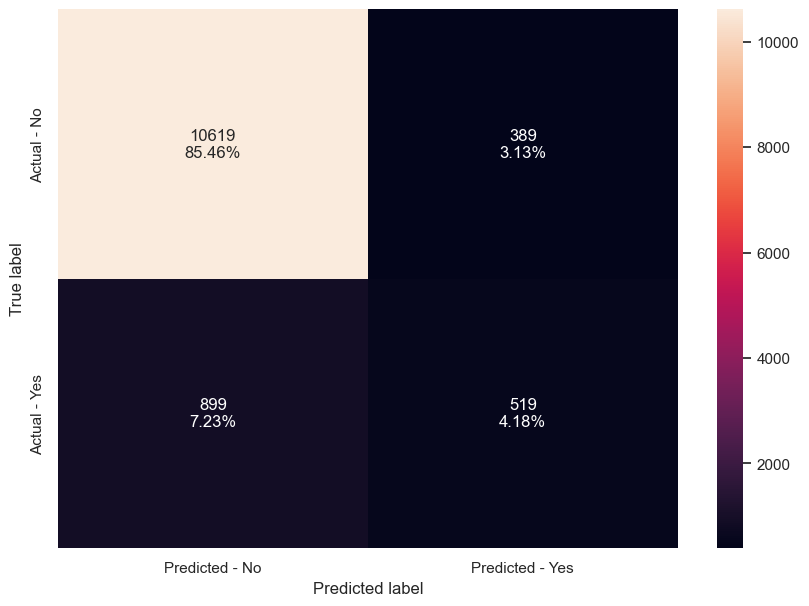

<IPython.core.display.Javascript object>

In [50]:
# Graph the Confusion Matrix
make_confusion_matrix(bagging_estimator, y_test)

* This model is overfitting on training, as we can see from the spread between recall values for training and test data

__Next we'll try a Bagging classifier, passing the base_estimator to specify Logistic Regression__

In [51]:
bagging_lr = BaggingClassifier(
    base_estimator=LogisticRegression(
        solver="liblinear", random_state=1, max_iter=1000
    ),
    random_state=1,
)
bagging_lr.fit(X_train, y_train)

BaggingClassifier(base_estimator=LogisticRegression(max_iter=1000,
                                                    random_state=1,
                                                    solver='liblinear'),
                  random_state=1)

<IPython.core.display.Javascript object>

In [52]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
bagging_lr_score = get_metrics_score(bagging_lr)

Accuracy on training set :  0.9036664022350223
Accuracy on test set :  0.9031063898277805
Recall on training set :  0.32356495468277946
Recall on test set :  0.3321579689703808
Precision on training set :  0.6590769230769231
Precision on test set :  0.646978021978022
F1 on training set :  0.4340425531914894
F1 on test set :  0.43895619757688725


<IPython.core.display.Javascript object>

In [53]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    bagging_lr_score[2] - bagging_lr_score[3],
)

Recall score spread between Train and Test data is -0.008593014287601342


<IPython.core.display.Javascript object>

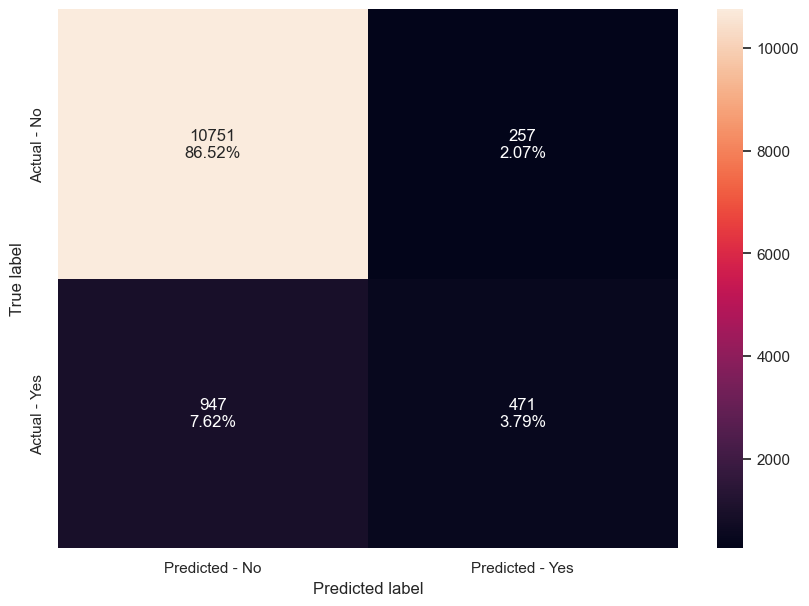

<IPython.core.display.Javascript object>

In [54]:
# Graph the Confusion Matrix
make_confusion_matrix(bagging_lr, y_test)

* Well, it stopped overfitting. But the recall is completely unuseable. Logistic regression as a base estimator is probably not a good fit for this problem.

##### Tuned Bagging Classifier

Next we'll try tuning the Bagging classifier, running GridSearch.  The critical parameters here are:

* base_estimator: The base estimator to fit on random subsets of the dataset. If None(default), then the base estimator is a decision tree.
* n_estimators: The number of trees in the forest, default = 100.
* max_features: The number of features to consider when looking for the best split.
* bootstrap: Whether bootstrap samples are used when building trees. If False, the entire dataset is used to build each tree, default=True.
* bootstrap_features: If it is true, then features are drawn with replacement. Default value is False.
* max_samples: If bootstrap is True, then the number of samples to draw from X to train each base estimator. If None (default), then draw N samples, where N is the number of observations in the train data.
* oob_score: Whether to use out-of-bag samples to estimate the generalization accuracy, default=False.

In [55]:
%%time
# Choose the type of classifier. 
bagging_estimator_tuned = BaggingClassifier(random_state=1,oob_score=True)

# Grid of parameters to choose from
## add from article
parameters = {'max_samples': [0.7,0.8,0.9,1], 
              'max_features': [0.6,0.7,0.8,0.9],
              'n_estimators' : [10,20,30,40,50],
             }

# Type of scoring used to compare parameter combinations - optimizing for recall
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(bagging_estimator_tuned, parameters, scoring=acc_scorer,cv=5, n_jobs=-1)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
bagging_estimator_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
bagging_estimator_tuned.fit(X_train, y_train)

Wall time: 50.5 s


BaggingClassifier(max_features=0.9, max_samples=0.9, n_estimators=40,
                  oob_score=True, random_state=1)

<IPython.core.display.Javascript object>

In [56]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
bagging_estimator_tuned_score = get_metrics_score(bagging_estimator_tuned)

Accuracy on training set :  0.9980684992929327
Accuracy on test set :  0.8998068565910188
Recall on training set :  0.9833836858006042
Recall on test set :  0.33638928067700985
Precision on training set :  0.9996928746928747
Precision on test set :  0.6107554417413572
F1 on training set :  0.9914712153518124
F1 on test set :  0.4338335607094133


<IPython.core.display.Javascript object>

In [57]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    bagging_estimator_tuned_score[2] - bagging_estimator_tuned_score[3],
)

Recall score spread between Train and Test data is 0.6469944051235943


<IPython.core.display.Javascript object>

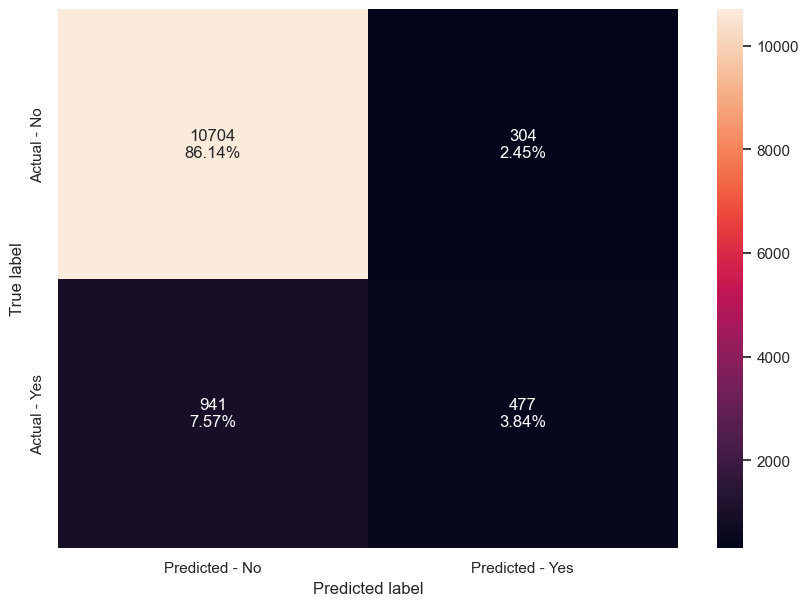

<IPython.core.display.Javascript object>

In [58]:
# Graph the Confusion Matrix
make_confusion_matrix(bagging_estimator_tuned, y_test)

Better, but still overfitting. Enabling oob_scoring actually didn't help.

#### Random Forest

Next we'll try a Random Forest classifier with default parameters

In [59]:
# Train the random forest classifier
rf_estimator = RandomForestClassifier(random_state=1)
rf_estimator.fit(X_train, y_train)

RandomForestClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [60]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
rf_estimator_score = get_metrics_score(rf_estimator)

Accuracy on training set :  0.9999310178318904
Accuracy on test set :  0.9013359085787864
Recall on training set :  0.9993957703927493
Recall on test set :  0.38011283497884346
Precision on training set :  1.0
Precision on test set :  0.608352144469526
F1 on training set :  0.9996977938954367
F1 on test set :  0.4678819444444444


<IPython.core.display.Javascript object>

In [61]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    rf_estimator_score[2] - rf_estimator_score[3],
)

Recall score spread between Train and Test data is 0.6192829354139058


<IPython.core.display.Javascript object>

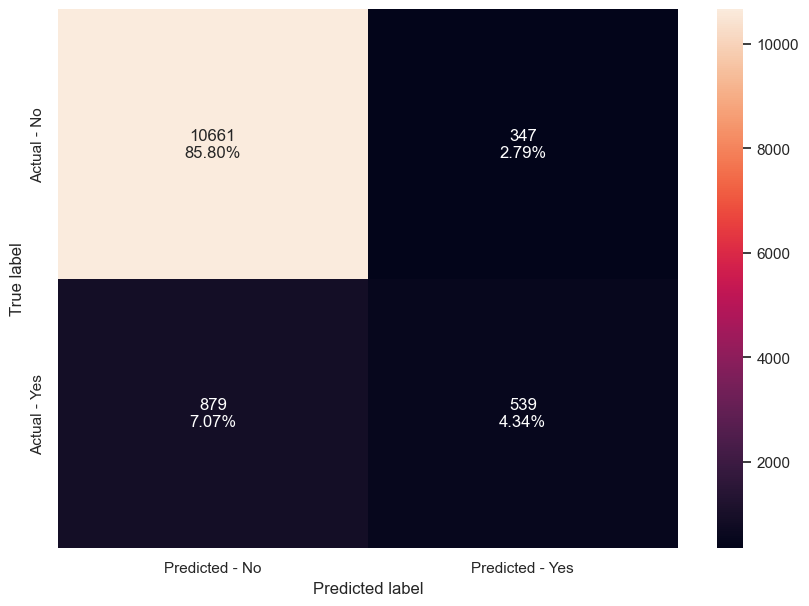

<IPython.core.display.Javascript object>

In [62]:
# Graph the Confusion Matrix
make_confusion_matrix(rf_estimator, y_test)

Accuracy is good, but recall is terrible and this model overfits as well

##### Tuned Random Forest

Next up is Random Forest with hyperparameter tuning.  The critical parameters here are:

* n_estimators: The number of trees in the forest, default = 100.
* max_features: The number of features to consider when looking for the best split.
* class_weight: Weights associated with classes in the form {class_label: weight}.If not given, all classes are supposed to have weight one.
    * For example: If the frequency of class 0 is 80% and the frequency of class 1 is 20% in the data, then class 0 will become the dominant class and the model will become biased toward the dominant classes. In this case, we can pass a dictionary {0:0.2,1:0.8} to the model to specify the weight of each class and the random forest will give more weightage to class 1.
* bootstrap: Whether bootstrap samples are used when building trees. If False, the entire dataset is used to build each tree, default=True.
* max_samples: If bootstrap is True, then the number of samples to draw from X to train each base estimator. If None (default), then draw N samples, where N is the number of observations in the train data.
* oob_score: Whether to use out-of-bag samples to estimate the generalization accuracy, default=False.

Note: Many hyperparameters of Decision Trees are also available to tune Random Forest like max_depth, min_sample_split etc.

In [63]:
%%time
# Choose the type of classifier. 
rf_estimator_tuned = RandomForestClassifier(random_state=1,class_weight="balanced",max_depth=4)

# Grid of parameters to choose from
## add from article
parameters = {"n_estimators": [150,200,250,400],
    "criterion":["gini","entropy"],
    "min_samples_split" : np.arange(10,15),
    "min_samples_leaf": np.arange(5, 15),
    "max_features": ["sqrt", "log2"],
    "max_samples": np.arange(0.3, 0.7, 0.9),
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(rf_estimator_tuned, parameters, scoring=acc_scorer,cv=5, n_jobs=-1)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_estimator_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
rf_estimator_tuned.fit(X_train, y_train)

Wall time: 4min 37s


RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=4, max_features='sqrt', max_samples=0.3,
                       min_samples_leaf=6, min_samples_split=13,
                       n_estimators=400, random_state=1)

<IPython.core.display.Javascript object>

In [64]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
rf_estimator_tuned_score = get_metrics_score(rf_estimator_tuned)

Accuracy on training set :  0.829476080433208
Accuracy on test set :  0.8210204410107839
Recall on training set :  0.7996978851963746
Recall on test set :  0.8180535966149506
Precision on training set :  0.3820727482678984
Precision on test set :  0.3710812539987204
F1 on training set :  0.5170931822621606
F1 on test set :  0.5105633802816901


<IPython.core.display.Javascript object>

In [65]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    rf_estimator_tuned_score[2] - rf_estimator_tuned_score[3],
)

Recall score spread between Train and Test data is -0.01835571141857595


<IPython.core.display.Javascript object>

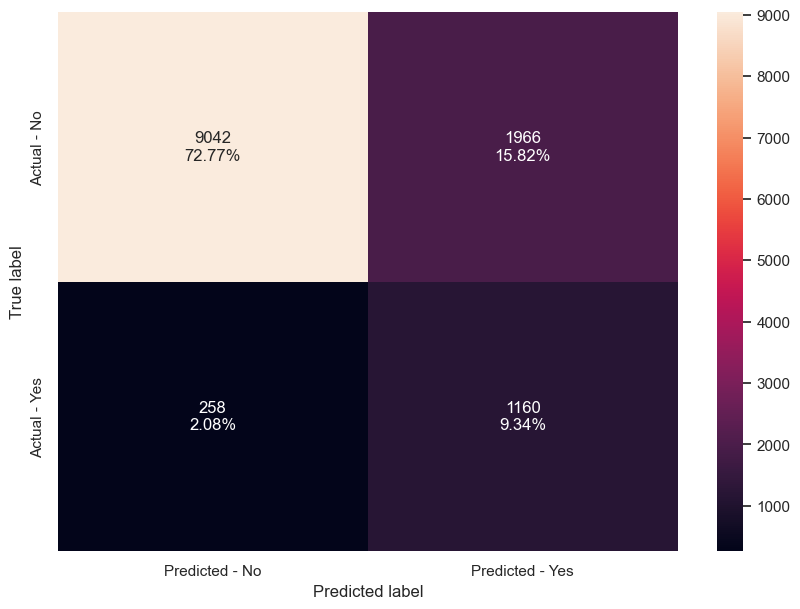

<IPython.core.display.Javascript object>

In [66]:
# Graph the Confusion Matrix
make_confusion_matrix(rf_estimator_tuned, y_test)

* That has definitely reduced overfitting, but accuracy is not terrific
* Note we did use class-weight="balanced" for this model

#### Decision Tree

Next we'll try a full Decision Tree model, and visualize it

In [67]:
# Train our full decision tree
dTree = DecisionTreeClassifier(
    criterion="gini", class_weight="balanced", random_state=1
)
dTree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', random_state=1)

<IPython.core.display.Javascript object>

In [68]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
dTree_score = get_metrics_score(dTree)

Accuracy on training set :  1.0
Accuracy on test set :  0.8618219861580557
Recall on training set :  1.0
Recall on test set :  0.3906911142454161
Precision on training set :  1.0
Precision on test set :  0.3937455579246624
F1 on training set :  1.0
F1 on test set :  0.392212389380531


<IPython.core.display.Javascript object>

In [69]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    dTree_score[2] - dTree_score[3],
)

Recall score spread between Train and Test data is 0.6093088857545839


<IPython.core.display.Javascript object>

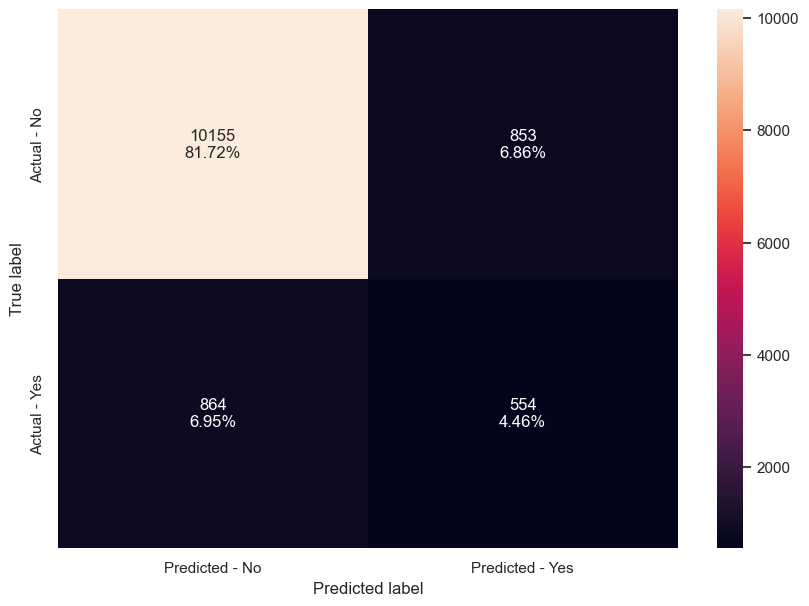

<IPython.core.display.Javascript object>

In [70]:
# Graph the Confusion Matrix
make_confusion_matrix(dTree, y_test)

In [71]:
# Get our list of independent features. We need these to visualize decision trees
feature_names = list(X.columns)
print(feature_names)

['age', 'balance', 'duration', 'campaign', 'pdays', 'previous', 'job_admin', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid', 'job_management', 'job_retired', 'job_self-employed', 'job_services', 'job_student', 'job_technician', 'job_unemployed', 'marital_divorced', 'marital_married', 'marital_single', 'education_primary', 'education_secondary', 'education_tertiary', 'default_no', 'default_yes', 'housing_no', 'housing_yes', 'loan_no', 'loan_yes', 'poutcome_failure', 'poutcome_success', 'poutcome_unknown']


<IPython.core.display.Javascript object>

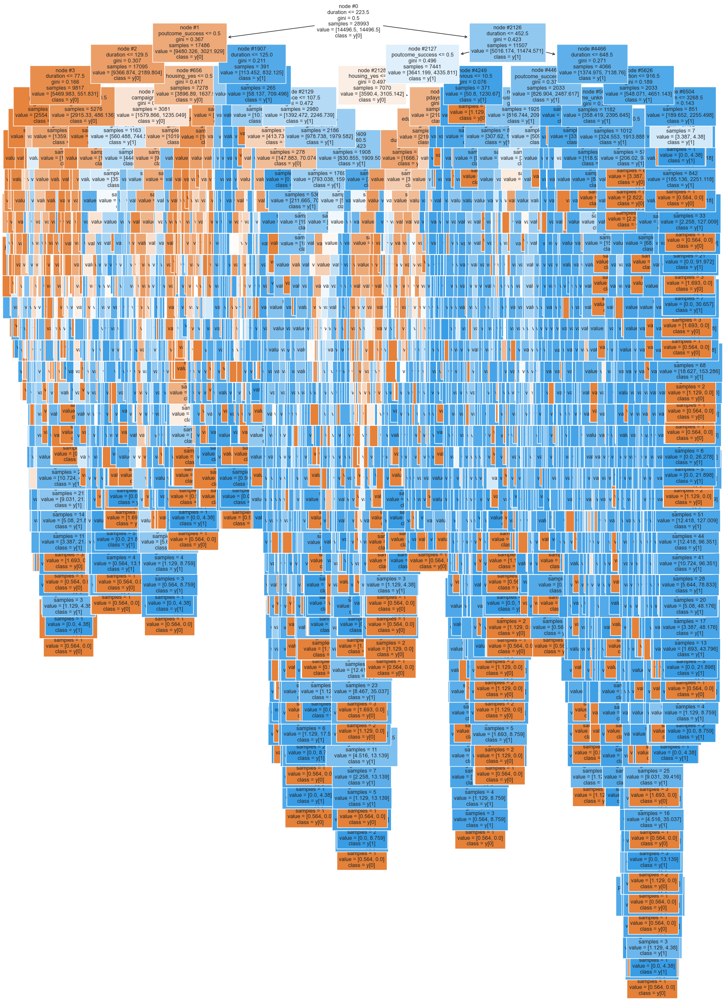

<IPython.core.display.Javascript object>

In [72]:
# Visualize the full decision tree
plt.figure(figsize=(20, 30))
tree.plot_tree(
    dTree,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=True,
    class_names=True,
)
plt.show()

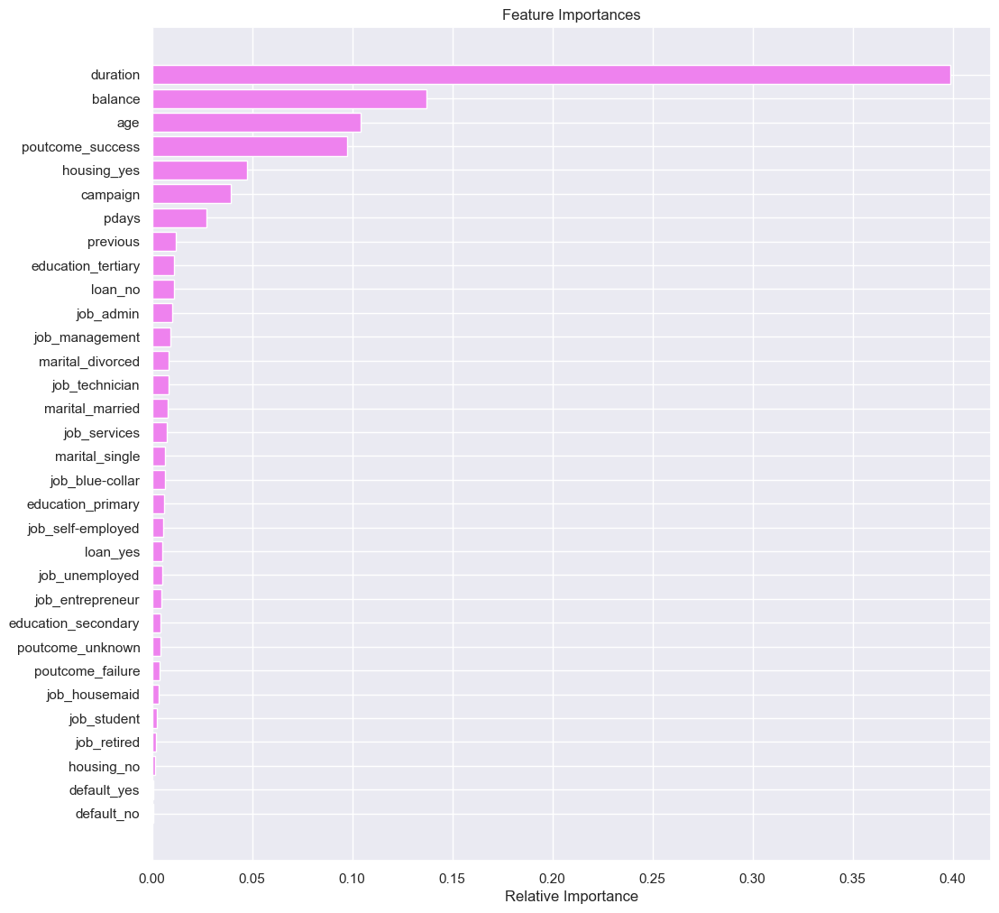

<IPython.core.display.Javascript object>

In [73]:
# Visualize the Gini importances of our features
importances = dTree.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

* This is a classically over-trained and complex model.
* Note we used class weighting for this model, as well

##### Tuned Decision Tree

Next we'll run a grid search to try to tune our Decision Tree model

In [74]:
%%time
# Choose the type of classifier.
dTree_tuned = DecisionTreeClassifier(random_state=1,class_weight="balanced")

# Grid of parameters to choose from
parameters = {
    "max_depth": np.arange(4, 10),
    "min_samples_split" : np.arange(15,20),
    "min_samples_leaf": [10,15, 20, 30],
    "max_features": np.arange(0.2, 0.9),
    "min_impurity_decrease": [0.001,0.01, 0.1],
}

# Type of scoring used to compare parameter combinations
scoring = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(dTree_tuned, parameters, scoring=scoring, cv=10, return_train_score=True)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
dTree_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
dTree_tuned.fit(X_train, y_train)

Wall time: 1min 31s


DecisionTreeClassifier(class_weight='balanced', max_depth=7, max_features=0.2,
                       min_impurity_decrease=0.001, min_samples_leaf=15,
                       min_samples_split=15, random_state=1)

<IPython.core.display.Javascript object>

In [75]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
dTree_tuned_score = get_metrics_score(dTree_tuned)

Accuracy on training set :  0.47221743179388126
Accuracy on test set :  0.4716723000160953
Recall on training set :  0.8235649546827795
Recall on test set :  0.8159379407616361
Precision on training set :  0.15627149736299015
Precision on test set :  0.15507304650851092
F1 on training set :  0.26269634769201117
F1 on test set :  0.26061493411420206


<IPython.core.display.Javascript object>

In [76]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    dTree_tuned_score[2] - dTree_tuned_score[3],
)

Recall score spread between Train and Test data is 0.0076270139211434


<IPython.core.display.Javascript object>

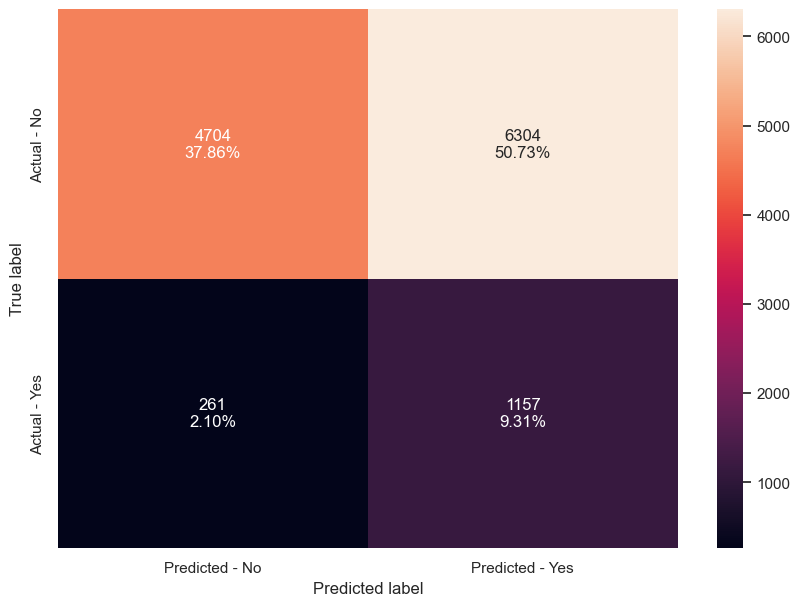

<IPython.core.display.Javascript object>

In [77]:
# Graph the Confusion Matrix
make_confusion_matrix(dTree_tuned, y_test)

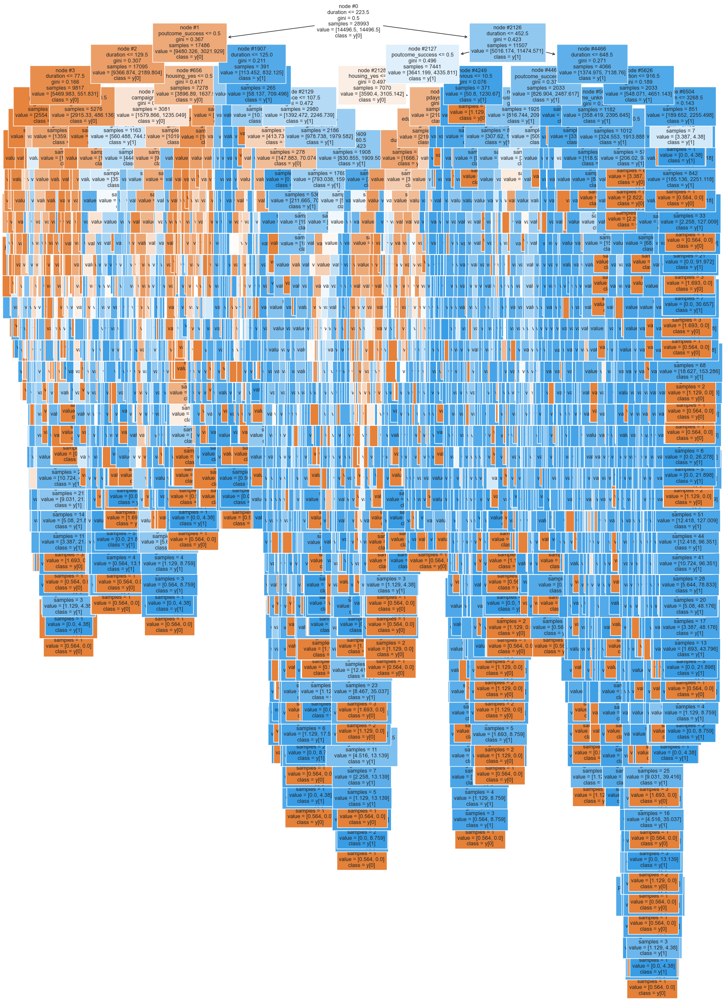

<IPython.core.display.Javascript object>

In [78]:
# Visualize the full decision tree
plt.figure(figsize=(20, 30))
tree.plot_tree(
    dTree,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=True,
    class_names=True,
)
plt.show()

* The recall scores and accuracy are poor, but the model's not overfitting.  

##### Tuned Decision Tree (Cost Complexity Pruned)

One more optimization we'll try for Decision tree is to post-prune using minimal cost complexity pruning

In [79]:
# we'll build our decision tree classifier, and then iterate to use an ccp_alpha value based on our validation
dTree_ccp = DecisionTreeClassifier(random_state=1)
path = dTree_ccp.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

<IPython.core.display.Javascript object>

In [80]:
# Train a decision tree with the effective alphas
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=1, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.026918629049690918


<IPython.core.display.Javascript object>

In [81]:
# Remove the last element with only the one node
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

<IPython.core.display.Javascript object>

In [82]:
# Let's plot the train and test scores for accuracy
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

<IPython.core.display.Javascript object>

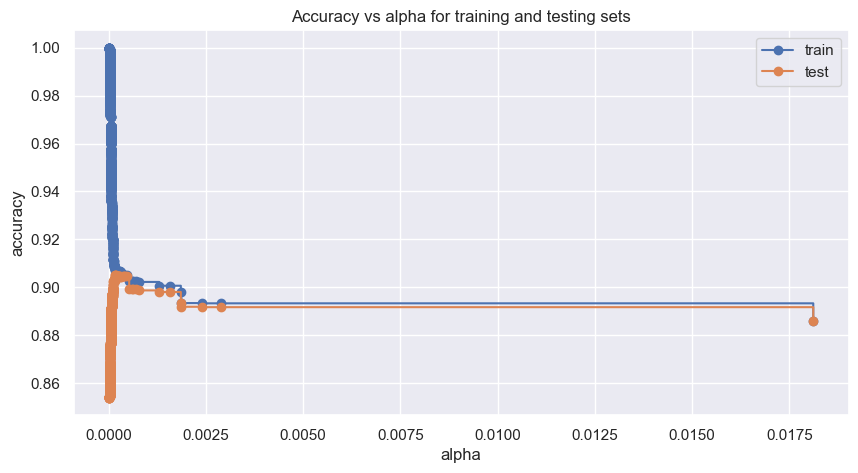

<IPython.core.display.Javascript object>

In [83]:
# Draw the plot for accuracy versus alpha
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [84]:
index_best_model = np.argmax(test_scores)
best_model = clfs[index_best_model]
print(best_model)
print("Training accuracy of best model: ", best_model.score(X_train, y_train))
print("Test accuracy of best model: ", best_model.score(X_test, y_test))

DecisionTreeClassifier(ccp_alpha=0.00016423472337551918, random_state=1)
Training accuracy of best model:  0.907184492808609
Test accuracy of best model:  0.9049573474971834


<IPython.core.display.Javascript object>

* __Which is wonderful, but we want to optimize for recall__

In [85]:
# Plot our recall scores for test and train data
recall_train = []
for clf in clfs:
    pred_train3 = clf.predict(X_train)
    values_train = metrics.recall_score(y_train, pred_train3)
    recall_train.append(values_train)

<IPython.core.display.Javascript object>

In [86]:
# Plot our recall scores for test and train data
recall_test = []
for clf in clfs:
    pred_test3 = clf.predict(X_test)
    values_test = metrics.recall_score(y_test, pred_test3)
    recall_test.append(values_test)

<IPython.core.display.Javascript object>

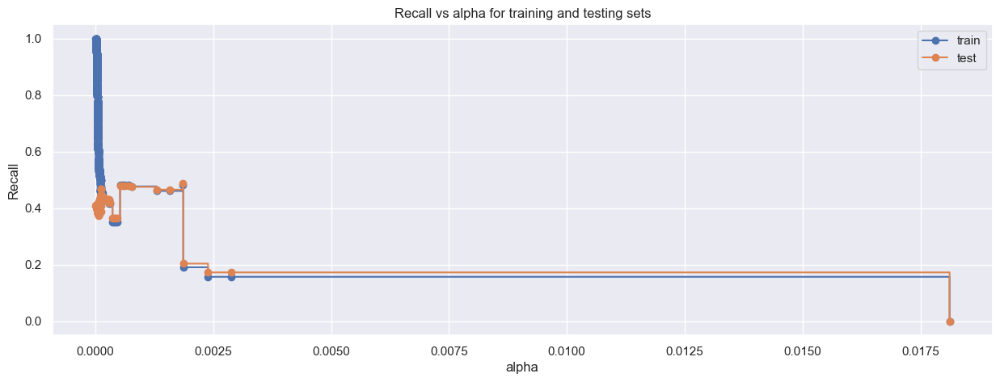

<IPython.core.display.Javascript object>

In [87]:
# Draw recall versus alpha for test and training datasets
fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall vs alpha for training and testing sets")
ax.plot(ccp_alphas, recall_train, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, recall_test, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [88]:
# creating the model where we get highest train and test recall
index_best_model = np.argmax(recall_test)
dTree_ccp = clfs[index_best_model]
print(dTree_ccp)

DecisionTreeClassifier(ccp_alpha=0.0018540330504541545, random_state=1)


<IPython.core.display.Javascript object>

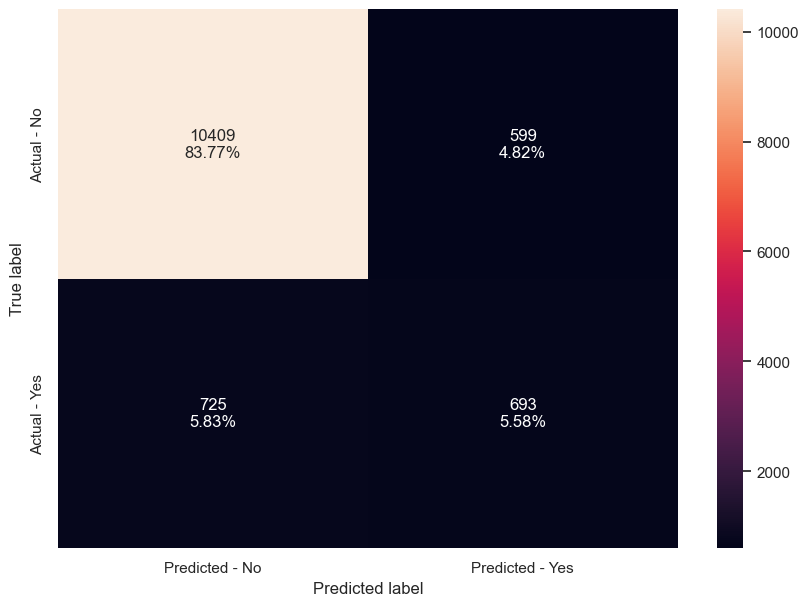

<IPython.core.display.Javascript object>

In [89]:
# Graph the Confusion Matrix
make_confusion_matrix(dTree_ccp, y_test)

In [90]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
dTree_ccp_score = get_metrics_score(dTree_ccp)

Accuracy on training set :  0.8980788466181492
Accuracy on test set :  0.893449219378722
Recall on training set :  0.48308157099697885
Recall on test set :  0.48871650211565587
Precision on training set :  0.5624340485402743
Precision on test set :  0.5363777089783281
F1 on training set :  0.5197464651389566
F1 on test set :  0.5114391143911439


<IPython.core.display.Javascript object>

In [91]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    dTree_ccp_score[2] - dTree_ccp_score[3],
)

Recall score spread between Train and Test data is -0.005634931118677022


<IPython.core.display.Javascript object>

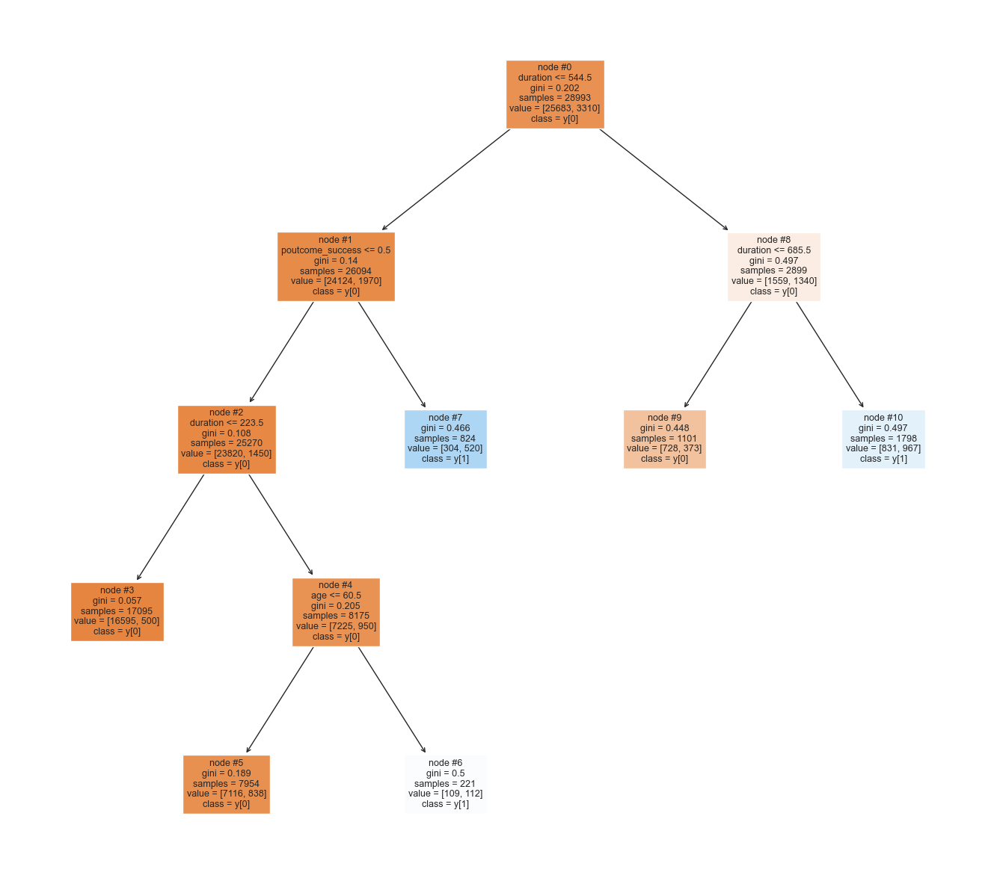

<IPython.core.display.Javascript object>

In [92]:
# Visualize the full decision tree
plt.figure(figsize=(17, 15))

tree.plot_tree(
    dTree_ccp,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=True,
    class_names=True,
)
plt.show()

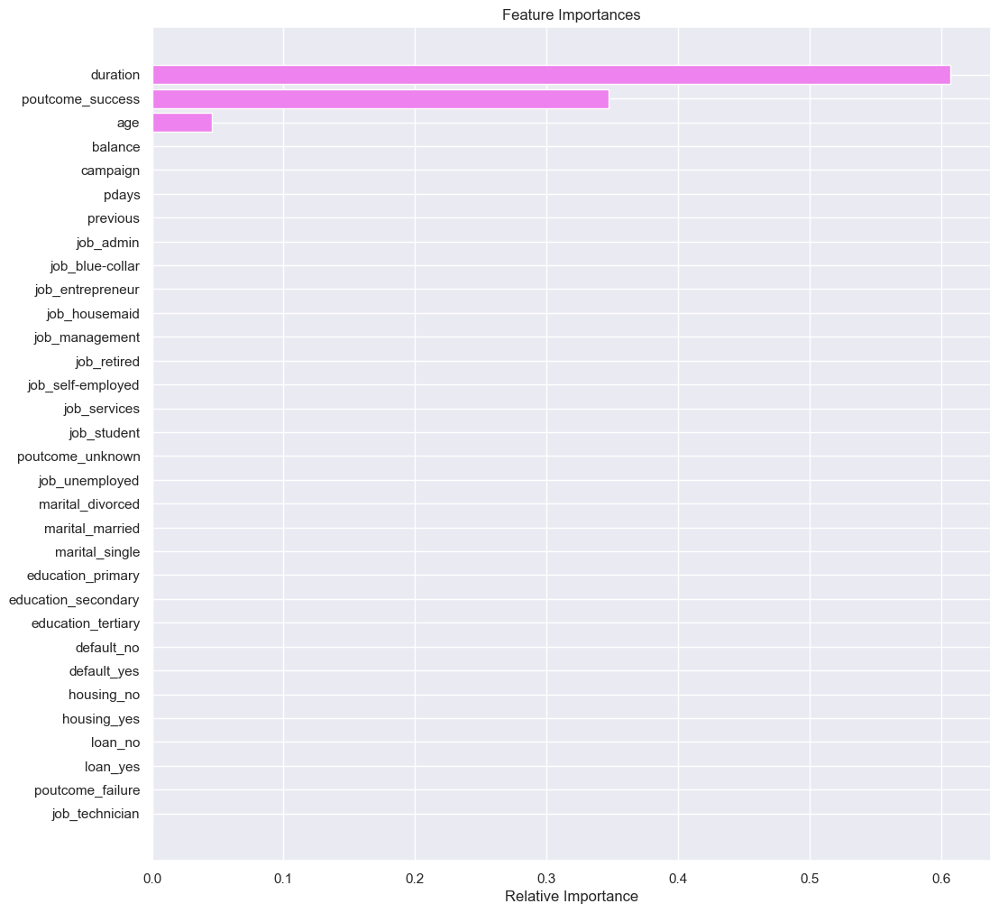

<IPython.core.display.Javascript object>

In [93]:
# Visualize the Gini importances of our features
importances = dTree_ccp.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

* Great accuracy, but disastrous recall.  

#### Bagging Performance Summary

In [94]:
# defining list of models
models = [
    bagging_estimator,
    bagging_lr,
    bagging_estimator_tuned,
    rf_estimator,
    rf_estimator_tuned,
    dTree,
    dTree_tuned,
    dTree_ccp,
]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = []
f1_test = []

# looping through all the models to get the accuracy, recall, precision, and F1 scores
for model in models:
    j = get_metrics_score(model, False)
    acc_train.append(np.round(j[0], 2))
    acc_test.append(np.round(j[1], 2))
    recall_train.append(np.round(j[2], 2))
    recall_test.append(np.round(j[3], 2))
    precision_train.append(np.round(j[4], 2))
    precision_test.append(np.round(j[5], 2))
    f1_train.append(np.round(j[6], 2))
    f1_test.append(np.round(j[7], 2))

<IPython.core.display.Javascript object>

In [95]:
comparison_frame = pd.DataFrame(
    {
        "Model": [
            "Bagging classifier with default parameters",
            "Bagging classifier with base_estimator=LR",
            "Tuned Bagging Classifier",
            "Random Forest with default parameters",
            "Tuned Random Forest Classifier",
            "Decision Tree with default parameters",
            "Tuned Decision Tree",
            "Post-Pruned Decision Tree",
        ],
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1": f1_train,
        "Test_F1": f1_test,
    }
)
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
0,Bagging classifier with default parameters,0.99,0.90,0.92,0.37,0.99,0.57,0.96,0.45
1,Bagging classifier with base_estimator=LR,0.90,0.90,0.32,0.33,0.66,0.65,0.43,0.44
2,Tuned Bagging Classifier,1.00,0.90,0.98,0.34,1.00,0.61,0.99,0.43
3,Random Forest with default parameters,1.00,0.90,1.00,0.38,1.00,0.61,1.00,0.47
4,Tuned Random Forest Classifier,0.83,0.82,0.80,0.82,0.38,0.37,0.52,0.51
5,Decision Tree with default parameters,1.00,0.86,1.00,0.39,1.00,0.39,1.00,0.39
6,Tuned Decision Tree,0.47,0.47,0.82,0.82,0.16,0.16,0.26,0.26
7,Post-Pruned Decision Tree,0.90,0.89,0.48,0.49,0.56,0.54,0.52,0.51


<IPython.core.display.Javascript object>

* Most of these show some overfitting with default parameters.
* Several offer high accuracy, with unacceptably low recall values.
* Our Tuned Decision tree produces good recall value, but with unacceptably low accuracy.
* Tuned Random Forest is the best overall performer, with a balance of accuracy and recall.

### Boosting Models

"Boosting" models adapt and improve with iteration, using various techniques.  We'll explore several boosting models in this section.

#### Adaboost

We'll start with AdaBoost, with the default set of parameters

An AdaBoost classifier is a meta-estimator that begins by fitting a classifier on the original dataset and then fits additional copies of the classifier on the same dataset, but where the weights of incorrectly classified instances are adjusted such that subsequent classifiers focus more on difficult cases.

In [96]:
abc = AdaBoostClassifier(random_state=1)
abc.fit(X_train, y_train)

AdaBoostClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [97]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
abc_score = get_metrics_score(abc)

Accuracy on training set :  0.9020453212844479
Accuracy on test set :  0.9010140028971512
Recall on training set :  0.3577039274924471
Recall on test set :  0.3723554301833568
Precision on training set :  0.6238145416227608
Precision on test set :  0.6082949308755761
F1 on training set :  0.45468509984639016
F1 on test set :  0.46194225721784776


<IPython.core.display.Javascript object>

In [98]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    abc_score[2] - abc_score[3],
)

Recall score spread between Train and Test data is -0.014651502690909701


<IPython.core.display.Javascript object>

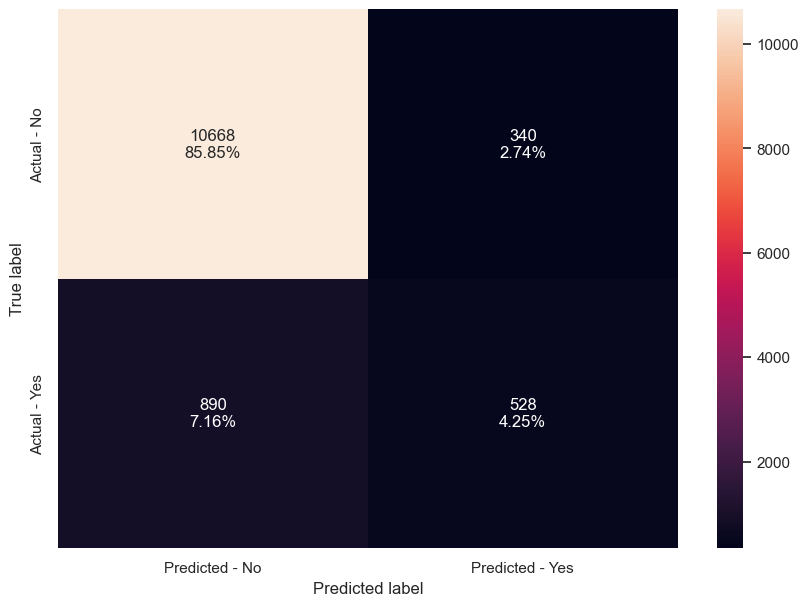

<IPython.core.display.Javascript object>

In [99]:
# Graph the Confusion Matrix
make_confusion_matrix(abc, y_test)

* In general, reasonable accuracy.  The recall spread between train and test is great, but the overall recall of the model is poor.

##### Tuned Adaboost

Next we'll try tuning the Adaboost algorithm with a GridSearch.  Some of the critical hyperparameters are:

* base_estimator: The base estimator from which the boosted ensemble is built. 
    * By default the base estimator is a decision tree with max_depth=1
* n_estimators: The maximum number of estimators at which boosting is terminated. 
    * Default value is 50.
* learning_rate: Learning rate shrinks the contribution of each classifier by learning_rate. 
    * There is a trade-off between learning_rate and n_estimators.
    
Parameters like max_depth and class_weight can also be passed in to help overfitting, or to deal with imbalanced classes.

In [100]:
%%time
# Choose the type of classifier. 
abc_tuned = AdaBoostClassifier(random_state=1)

# Grid of parameters 
parameters = {
    #Let's try different max_depth for base_estimator
    "base_estimator":[DecisionTreeClassifier(max_depth=2, random_state=1,class_weight="balanced"),
                      DecisionTreeClassifier(max_depth=3, random_state=1,class_weight="balanced"),
                      DecisionTreeClassifier(max_depth=4, random_state=1,class_weight="balanced")
                     ],
    "n_estimators": np.arange(10,120,10),
    "learning_rate":np.arange(0.1,2,0.1)
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search. Increasing cross-validation gave me a good bump in the results for this dataset
grid_obj = GridSearchCV(abc_tuned, parameters, scoring=acc_scorer,cv=5,n_jobs=-1)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
abc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
abc_tuned.fit(X_train, y_train)

Wall time: 6min 54s


AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         max_depth=3,
                                                         random_state=1),
                   learning_rate=0.5, n_estimators=10, random_state=1)

<IPython.core.display.Javascript object>

In [101]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
abc_tuned_score = get_metrics_score(abc_tuned)

Accuracy on training set :  0.8261304452798951
Accuracy on test set :  0.8184451955577016
Recall on training set :  0.8350453172205438
Recall on test set :  0.8293370944992948
Precision on training set :  0.38076870092299214
Precision on test set :  0.3686520376175549
F1 on training set :  0.5230390765446116
F1 on test set :  0.5104166666666667


<IPython.core.display.Javascript object>

In [102]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    abc_tuned_score[2] - abc_tuned_score[3],
)

Recall score spread between Train and Test data is 0.0057082227212489345


<IPython.core.display.Javascript object>

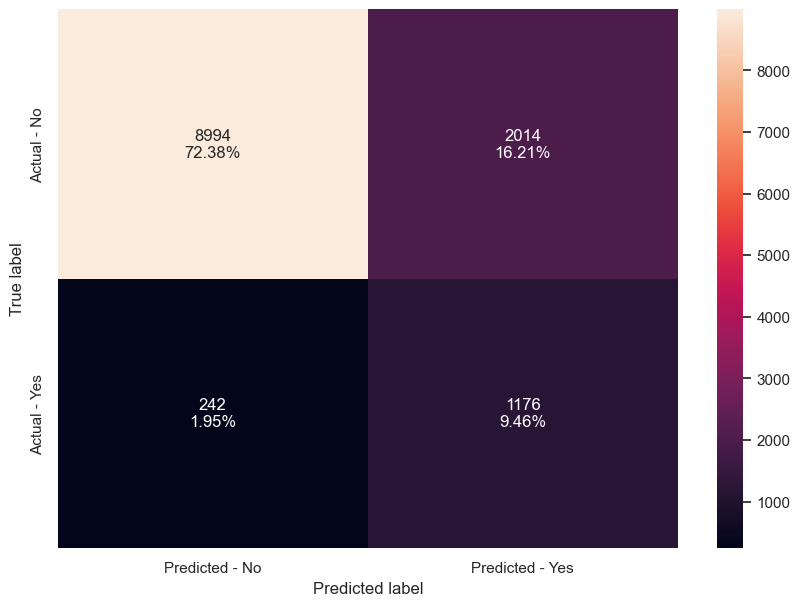

<IPython.core.display.Javascript object>

In [103]:
# Graph the Confusion Matrix
make_confusion_matrix(abc_tuned, y_test)

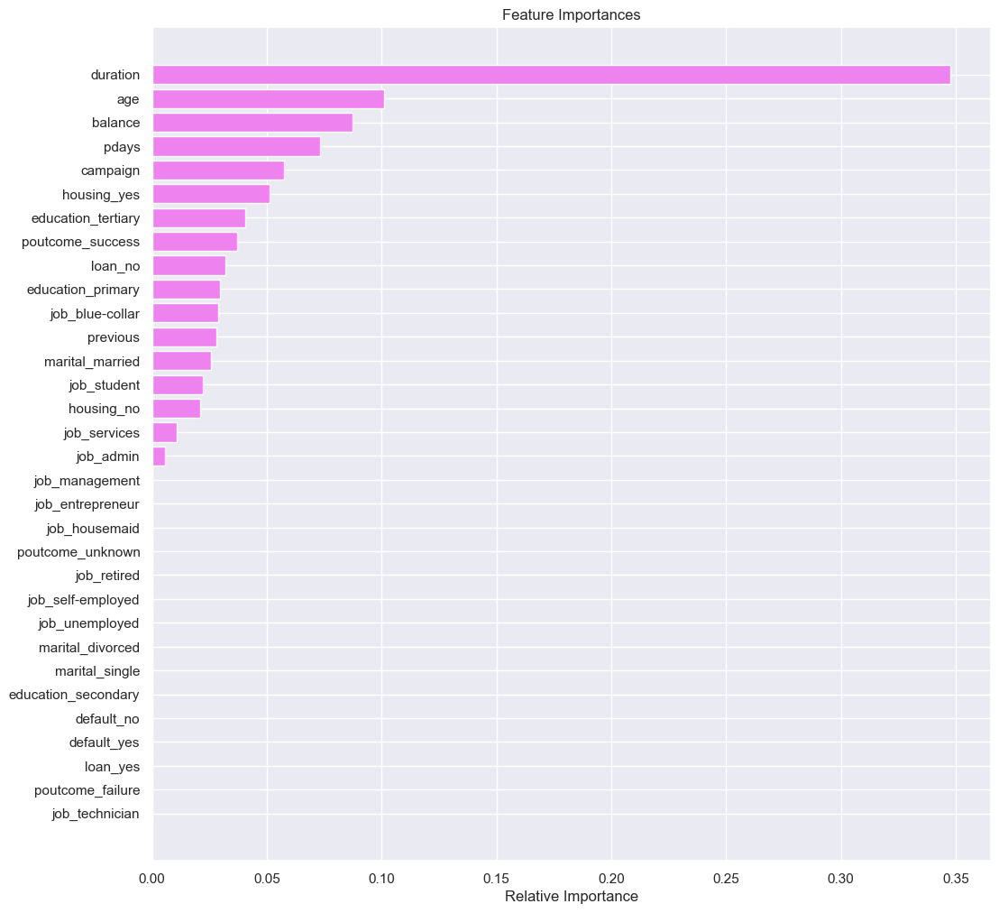

<IPython.core.display.Javascript object>

In [104]:
importances = abc_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

* This is actually pretty good; there's a relatively small split between train and test, and it's not overfitting. 
* Accuracy is greater than 80%.
* Duration, age, and balance are the critical factors here.
* Of the customer characteristics, age and balance are key predictors
* We're losing out on just under 2% here by missing our predictions. This is pretty good performance.

Let's see what the other algorithms can do.

#### Gradient Boosting

Next we'll try Gradient Boosting, with the default set of parameters

Gradient boosting iteratively adds decision trees to an ensemble of weak learners, training on the errors of the previous trees. The results are then combined. The "gradient" part of the algorithm is computing the gradient of the loss function with respect to the predictions, and then fitting the new tree on the residual.

In [105]:
gbc = GradientBoostingClassifier(random_state=1)
gbc.fit(X_train, y_train)

GradientBoostingClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [106]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
gbc_score = get_metrics_score(gbc)

Accuracy on training set :  0.9108750388024696
Accuracy on test set :  0.9051987767584098
Recall on training set :  0.40845921450151057
Recall on test set :  0.4083215796897038
Precision on training set :  0.6835187057633973
Precision on test set :  0.630718954248366
F1 on training set :  0.5113464447806355
F1 on test set :  0.49571917808219174


<IPython.core.display.Javascript object>

In [107]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    gbc_score[2] - gbc_score[3],
)

Recall score spread between Train and Test data is 0.00013763481180678605


<IPython.core.display.Javascript object>

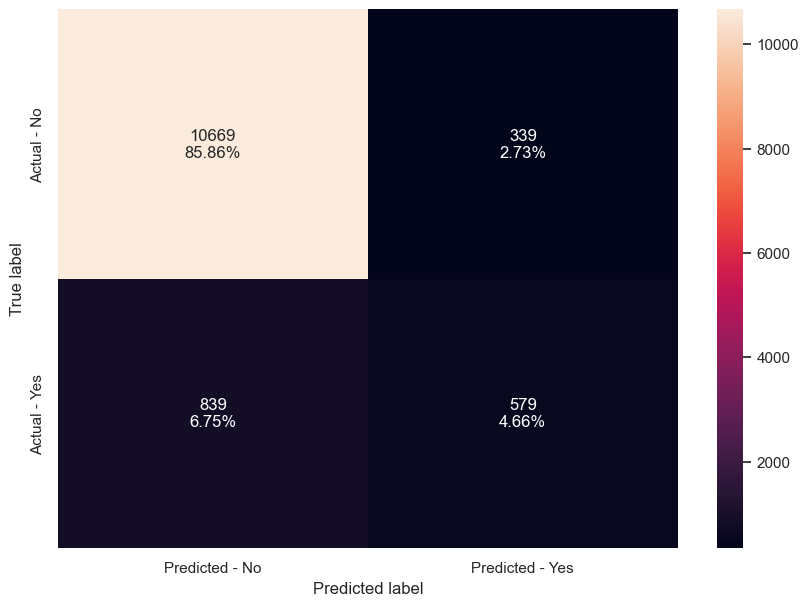

<IPython.core.display.Javascript object>

In [108]:
# Graph the Confusion Matrix
make_confusion_matrix(gbc, y_test)

* Accurate, but poor recall.  This actually gives us better performance for precision, but that's not what we're optimizing for.

##### Tuned Gradient Boosting

Next we'll try tuning our Gradient boosting classifier.

The critical hyperparameters here are:
* Many of the same as random forest classifier.
* init: An estimator object that is used to compute the initial predictions. 
    * If ‘zero’, the initial raw predictions are set to zero. 
    * By default, a DummyEstimator predicting the classes priors is used.

There is no class_weights parameter in gradient boosting.

Our previously trained tuned Adaboost model produced fairly good results.  Let's see if we can improve on those.

In [109]:
# Our gradient boost init score is the previously trained abc_tuned model
gbc_init_score = get_metrics_score(abc_tuned)

Accuracy on training set :  0.8261304452798951
Accuracy on test set :  0.8184451955577016
Recall on training set :  0.8350453172205438
Recall on test set :  0.8293370944992948
Precision on training set :  0.38076870092299214
Precision on test set :  0.3686520376175549
F1 on training set :  0.5230390765446116
F1 on test set :  0.5104166666666667


<IPython.core.display.Javascript object>

* This is certainly better than our GradientBoosting results with default values
* Since these results are significantly better, we'll use init=abc_tuned to tune our gradient boosting model

In [110]:
%%time
# Choose the type of classifier. 
gbc_tuned = GradientBoostingClassifier(init=abc_tuned,random_state=1)

# Grid of parameters to choose 
parameters = {
    "n_estimators": [500, 600],
    "subsample":[0.7,0.8,0.9, 1.0], 
    "max_features":[0.2, 0.3, 0.4],
    "learning_rate":[0.0001,0.0005],  
    "max_depth": [7,10,12],
    "min_samples_split": [50,100],
    "min_samples_leaf": [10,20],
    "n_iter_no_change": [5], #early stop
    "tol" : [0.0005,0.001] #early stop
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(gbc_tuned, parameters, scoring=acc_scorer,cv=5, n_jobs=-1)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
gbc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
gbc_tuned.fit(X_train, y_train)

Wall time: 38min 30s


GradientBoostingClassifier(init=AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                                         max_depth=3,
                                                                                         random_state=1),
                                                   learning_rate=0.5,
                                                   n_estimators=10,
                                                   random_state=1),
                           learning_rate=0.0001, max_depth=10, max_features=0.3,
                           min_samples_leaf=20, min_samples_split=50,
                           n_estimators=500, n_iter_no_change=5, random_state=1,
                           subsample=0.7, tol=0.0005)

<IPython.core.display.Javascript object>

In [111]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
gbc_tuned_score = get_metrics_score(gbc_tuned)

Accuracy on training set :  0.8196806125616528
Accuracy on test set :  0.8118461290841783
Recall on training set :  0.8356495468277946
Recall on test set :  0.8363892806770099
Precision on training set :  0.3712751677852349
Precision on test set :  0.3602673147023086
F1 on training set :  0.5141263940520445
F1 on test set :  0.5036093418259023


<IPython.core.display.Javascript object>

In [112]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    gbc_tuned_score[2] - gbc_tuned_score[3],
)

Recall score spread between Train and Test data is -0.0007397338492153294


<IPython.core.display.Javascript object>

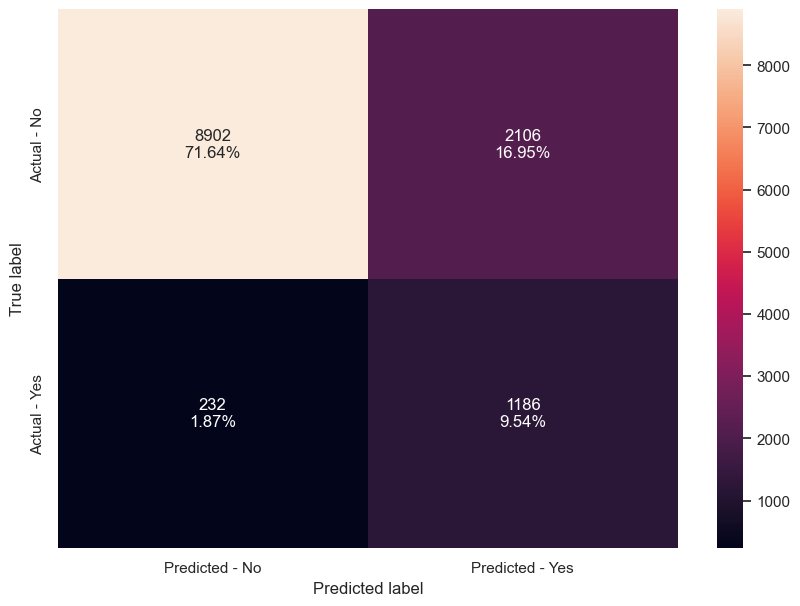

<IPython.core.display.Javascript object>

In [113]:
# Graph the Confusion Matrix
make_confusion_matrix(gbc_tuned, y_test)

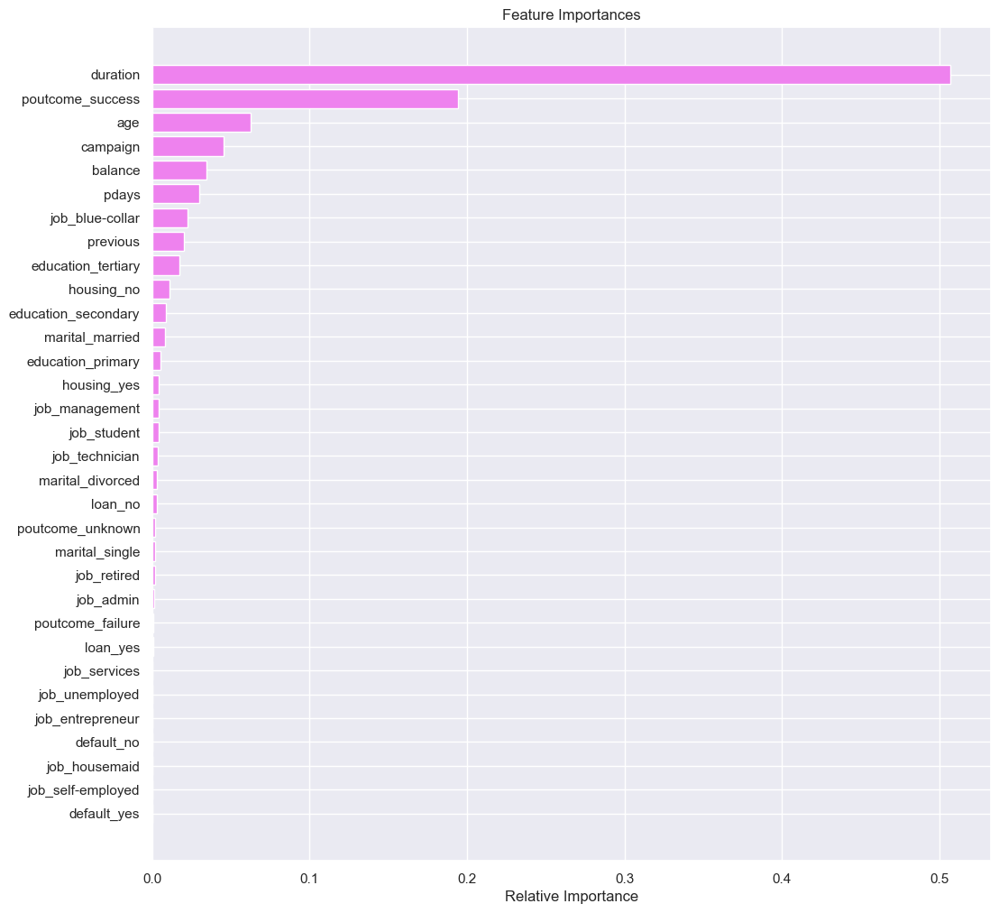

<IPython.core.display.Javascript object>

In [114]:
importances = gbc_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

* This is better, and it's pretty well balanced
* Trying to use early stop didn't seem to help it at all.
* Recall on both the the test and train sets are acceptable, and the accuracy is reasonably good.
* Test and train performance closely tracks, suggesting this would be robust in production.
* The feature importances seem to line up with the previous classifiers

#### XGBoost

Let's see what our XGBooosting Classifier produces for us. XGBoost has a rich set of critical parameters: 

* scale_pos_weight:Control the balance of positive and negative weights, useful for unbalanced classes. 
    * It has range from 0 to  ∞
* subsample: Corresponds to the fraction of observations (the rows) to subsample at each step. 
    * By default it is set to 1 meaning that we use all rows.
* colsample_bytree: Corresponds to the fraction of features (the columns) to use.
* colsample_bylevel: The subsample ratio of columns for each level. 
    * Columns are subsampled from the set of columns chosen for the current tree.
* colsample_bynode: The subsample ratio of columns for each node (split). 
    * Columns are subsampled from the set of columns chosen for the current level.
* max_depth: is the maximum number of nodes allowed from the root to the farthest leaf of a tree.
* learning_rate/eta: Makes the model more robust by shrinking the weights on each step.
* gamma: A node is split only when the resulting split gives a positive reduction in the loss function. 
    * Gamma specifies the minimum loss reduction required to make a split.

In [115]:
%%time
# Choose the type of classifier. 
xgb_tuned = XGBClassifier(random_state=1,eval_metric='logloss')

# Grid of parameters to choose from
## add from
parameters = {
    "n_estimators": np.arange(10,200,20),
    "scale_pos_weight":[0,1,2,5],
    "subsample":[0.5,0.7,0.9,1],
    "learning_rate":[0.01,0.1,0.05], #Removed 0.2
    "gamma":[1,3,4], #added 4
    "colsample_bytree":[0.5,0.7,0.9,1],
    "colsample_bylevel":[0.5,0.7,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters,scoring=acc_scorer,cv=5,n_jobs=-1)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_tuned.fit(X_train, y_train)

Wall time: 3h 32min 20s


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=0.5, colsample_bynode=None, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=3, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=90, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=1, ...)

<IPython.core.display.Javascript object>

In [116]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
xgb_tuned_score = get_metrics_score(xgb_tuned)

Accuracy on training set :  0.8680026213223881
Accuracy on test set :  0.853613391276356
Recall on training set :  0.8030211480362538
Recall on test set :  0.7863187588152327
Precision on training set :  0.45568318189610835
Precision on test set :  0.42379323451159256
F1 on training set :  0.5814284151810127
F1 on test set :  0.5507532724129416


<IPython.core.display.Javascript object>

In [117]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    xgb_tuned_score[2] - xgb_tuned_score[3],
)

Recall score spread between Train and Test data is 0.016702389221021074


<IPython.core.display.Javascript object>

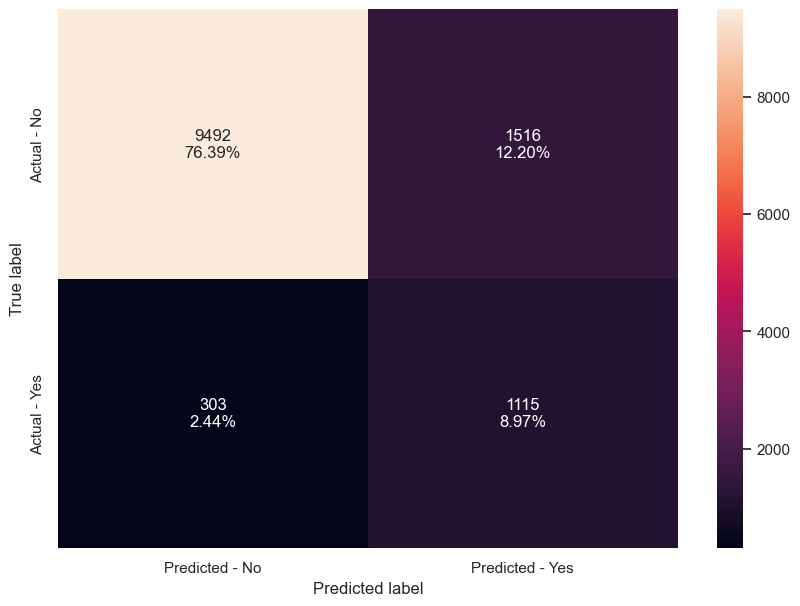

<IPython.core.display.Javascript object>

In [118]:
# Graph the Confusion Matrix
make_confusion_matrix(xgb_tuned, y_test)

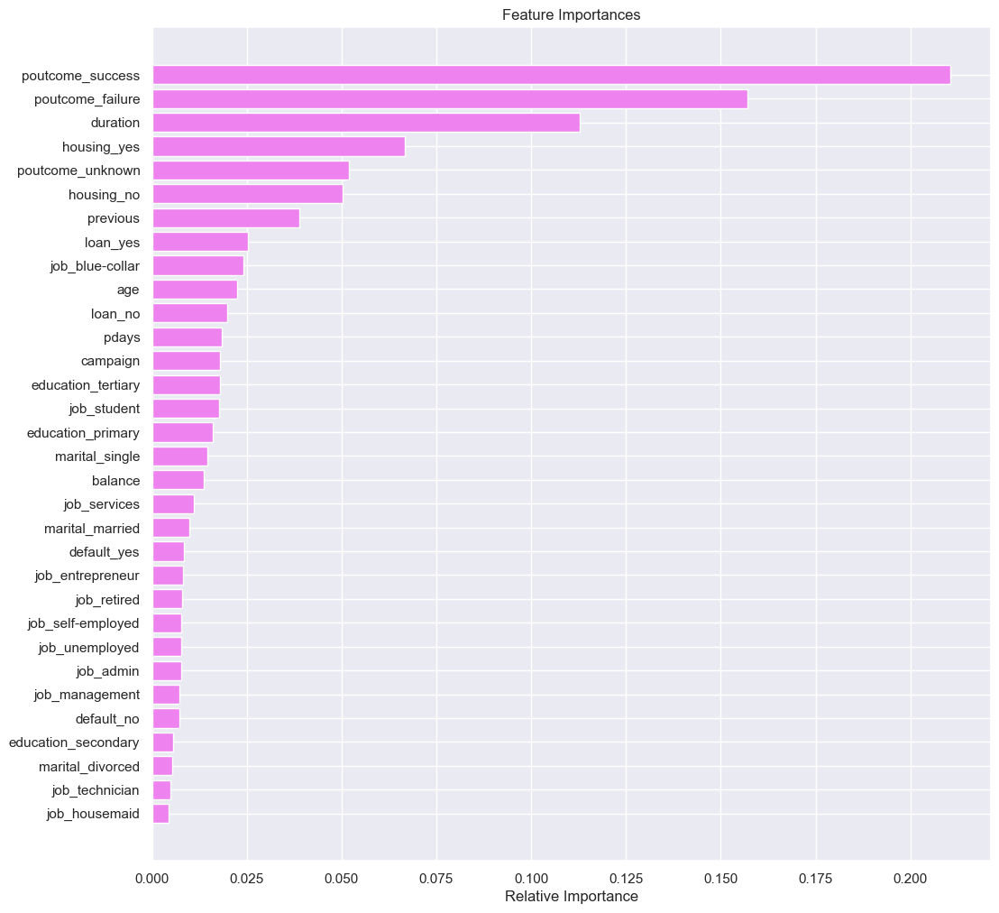

<IPython.core.display.Javascript object>

In [119]:
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

* What's interesting here is the feature importances with this classifier are completely different
* Performance on the test set is not optimal, but we're losing only 2.4% with our predictions
* I'm not that impressed with this algorithm for this application

#### Stacking Classifier

In [120]:
estimators = [
    ("Decision Tree", dTree_tuned),
    ("Random Forest", rf_estimator_tuned),
    ("Gradient Boosting", gbc_tuned),
]
final_estimator = XGBClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [121]:
stacking_estimator = StackingClassifier(
    estimators=estimators, final_estimator=final_estimator, cv=5
)
stacking_estimator.fit(X_train, y_train)

StackingClassifier(cv=5,
                   estimators=[('Decision Tree',
                                DecisionTreeClassifier(class_weight='balanced',
                                                       max_depth=7,
                                                       max_features=0.2,
                                                       min_impurity_decrease=0.001,
                                                       min_samples_leaf=15,
                                                       min_samples_split=15,
                                                       random_state=1)),
                               ('Random Forest',
                                RandomForestClassifier(class_weight='balanced',
                                                       criterion='entropy',
                                                       max_depth=4,
                                                       max_features='sqrt',
                                              

<IPython.core.display.Javascript object>

In [122]:
# Using our performance function to get accuracy, recall, precision, and F1 on train and test set
stacking_estimator_score = get_metrics_score(stacking_estimator)

Accuracy on training set :  0.901596937191736
Accuracy on test set :  0.9009335264767423
Recall on training set :  0.37099697885196375
Recall on test set :  0.3829337094499295
Precision on training set :  0.6143071535767884
Precision on test set :  0.6040044493882091
F1 on training set :  0.46261066114145794
F1 on test set :  0.4687095381959431


<IPython.core.display.Javascript object>

In [123]:
# Quick read on the spread between Recall values
print(
    "Recall score spread between Train and Test data is",
    stacking_estimator_score[2] - stacking_estimator_score[3],
)

Recall score spread between Train and Test data is -0.011936730597965739


<IPython.core.display.Javascript object>

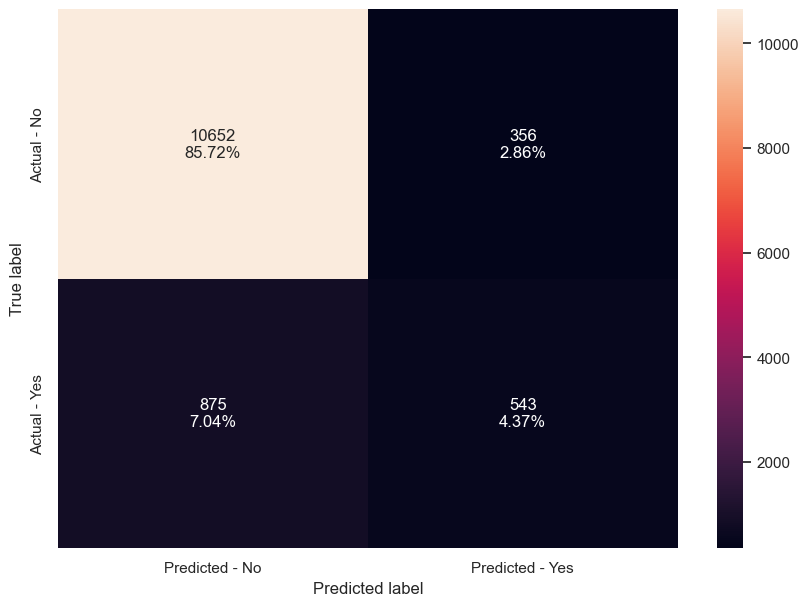

<IPython.core.display.Javascript object>

In [124]:
# Graph the Confusion Matrix
make_confusion_matrix(stacking_estimator, y_test)

#### Boosting Performance Summary

In [125]:
# defining list of models
models = [
    bagging_estimator,
    bagging_lr,
    bagging_estimator_tuned,
    rf_estimator,
    rf_estimator_tuned,
    dTree,
    dTree_tuned,
    dTree_ccp,
    abc,
    abc_tuned,
    gbc,
    gbc_tuned,
    xgb_tuned,
    stacking_estimator,
]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = []
f1_test = []

# looping through all the models to get the accuracy, recall, precision, and F1 scores
for model in models:
    j = get_metrics_score(model, False)
    acc_train.append(np.round(j[0], 2))
    acc_test.append(np.round(j[1], 2))
    recall_train.append(np.round(j[2], 2))
    recall_test.append(np.round(j[3], 2))
    precision_train.append(np.round(j[4], 2))
    precision_test.append(np.round(j[5], 2))
    f1_train.append(np.round(j[6], 2))
    f1_test.append(np.round(j[7], 2))

<IPython.core.display.Javascript object>

In [126]:
comparison_frame = pd.DataFrame(
    {
        "Model": [
            "Bagging classifier with default parameters",
            "Bagging classifier with base_estimator=LR",
            "Tuned Bagging Classifier",
            "Random Forest with default parameters",
            "Tuned Random Forest Classifier",
            "Decision Tree with default parameters",
            "Tuned Decision Tree",
            "Post-Pruned Decision Tree",
            "Adaboost classifier with default parameters",
            "Tuned Adaboost Classifier",
            "Gradient Boosting Classifier",
            "Tuned Gradient Boosting Classifier",
            "XGBoosting Classifier",
            "Stacking Estimator",
        ],
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1": f1_train,
        "Test_F1": f1_test,
    }
)
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
0,Bagging classifier with default parameters,0.99,0.90,0.92,0.37,0.99,0.57,0.96,0.45
1,Bagging classifier with base_estimator=LR,0.90,0.90,0.32,0.33,0.66,0.65,0.43,0.44
2,Tuned Bagging Classifier,1.00,0.90,0.98,0.34,1.00,0.61,0.99,0.43
3,Random Forest with default parameters,1.00,0.90,1.00,0.38,1.00,0.61,1.00,0.47
4,Tuned Random Forest Classifier,0.83,0.82,0.80,0.82,0.38,0.37,0.52,0.51
5,Decision Tree with default parameters,1.00,0.86,1.00,0.39,1.00,0.39,1.00,0.39
6,Tuned Decision Tree,0.47,0.47,0.82,0.82,0.16,0.16,0.26,0.26
7,Post-Pruned Decision Tree,0.90,0.89,0.48,0.49,0.56,0.54,0.52,0.51
8,Adaboost classifier with default parameters,0.90,0.90,0.36,0.37,0.62,0.61,0.45,0.46
9,Tuned Adaboost Classifier,0.83,0.82,0.84,0.83,0.38,0.37,0.52,0.51


<IPython.core.display.Javascript object>

## Conclusion and Recommendations

Overall, these algorithms didn't perform as well as I expected. I did expect to see overfitting, but I didn't see the improvements with tuning that I expected.

Of the models we tested, I would recommend we go into production with the tuned gradient boost classifier. That's the best balance between accuracy for this application, and recall that we're prioritizing.

__Business Recommendations__

* We see a large number of existing customers we've never contacted about our CD products.  We should contact them, track our contacts with them, and ensure they are aware of our products.
* We're spending about 4 min with each customer contact, so this scales well to our customer base.
* We're also seeing a definite activity trend around specific months; these are probably around campaigns. We should make an effort to even out our contacts about this product with customers more uniformly throughout the year.
* Our best candidates are younger, better educated customers - and people who identify as retirees.
    * Customers with higher balances, and customers we've spent time communicating with are also our best candidates